## Importation des packages

In [1]:
import pandas as pd
import math
import seaborn as sns
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import matplotlib
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import decomposition
from sklearn import preprocessing 
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from matplotlib.collections import LineCollection
from scipy.cluster.hierarchy import dendrogram
from scipy import stats
from scipy.stats import shapiro
import plotly.express as px

# Importation de dataframe


In [2]:
# Importation du dataset produit
data_foodfacts= pd.read_csv('fr.openfoodfacts.org.products.csv' , sep='\t', on_bad_lines='skip', low_memory=False)
data_foodfacts.head(5)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
#decouvrir la taille de notre base de données
data_foodfacts.shape

(320772, 162)

In [4]:
#decouvrir le type de chaque variable dans les colonnes
data_foodfacts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


In [5]:
#Description statistique
data_foodfacts.describe()

,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,0.0,248939.000000,248939.000000,0.0,248939.000000,0.0,0.0,2.611130e+05,857.000000,243891.000000,...,49.000000,3036.000000,165.000000,948.000000,0.0,268.000000,221210.000000,221210.000000,0.0,0.0
mean,NaN,1.936024,0.019659,NaN,0.055246,NaN,NaN,1.141915e+03,585.501214,12.730379,...,6.425698,31.458587,15.412121,49.547785,NaN,341.700764,9.165535,9.058049,NaN,NaN
std,NaN,2.502019,0.140524,NaN,0.269207,NaN,NaN,6.447154e+03,712.809943,17.578747,...,2.047841,31.967918,3.753028,18.757932,NaN,425.211439,9.055903,9.183589,NaN,NaN
min,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000,8.000000,6.000000,NaN,0.000000,-15.000000,-15.000000,NaN,NaN
25%,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,3.770000e+02,49.400000,0.000000,...,6.300000,0.000000,12.000000,32.000000,NaN,98.750000,1.000000,1.000000,NaN,NaN
50%,NaN,1.000000,0.000000,NaN,0.000000,NaN,NaN,1.100000e+03,300.000000,5.000000,...,7.200000,23.000000,15.000000,50.000000,NaN,195.750000,10.000000,9.000000,NaN,NaN
75%,NaN,3.000000,0.000000,NaN,0.000000,NaN,NaN,1.674000e+03,898.000000,20.000000,...,7.400000,51.000000,15.000000,64.250000,NaN,383.200000,16.000000,16.000000,NaN,NaN
max,NaN,31.000000,2.000000,NaN,6.000000,NaN,NaN,3.251373e+06,3830.000000,714.290000,...,8.400000,100.000000,25.000000,100.000000,NaN,2842.000000,40.000000,40.000000,NaN,NaN


In [6]:
#decouvrir le type de variable dans les lignes
data_foodfacts.dtypes

code                        object
url                         object
creator                     object
created_t                   object
created_datetime            object
                            ...   
carbon-footprint_100g      float64
nutrition-score-fr_100g    float64
nutrition-score-uk_100g    float64
glycemic-index_100g        float64
water-hardness_100g        float64
Length: 162, dtype: object

In [7]:
data_foodfacts.dtypes.value_counts()

float64    106
object      56
dtype: int64

<AxesSubplot:ylabel='None'>

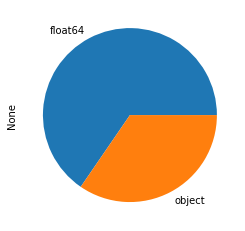

In [8]:
data_foodfacts.dtypes.value_counts().plot.pie()


# 2.Nettoyage des données 

In [9]:
#Les lignes repetées 
data_foodfacts.duplicated().sum()

0

In [10]:
#Decouverte des valeurs manquantes 
data_foodfacts.isnull().sum()

code                           23
url                            23
creator                         2
created_t                       3
created_datetime                9
                            ...  
carbon-footprint_100g      320504
nutrition-score-fr_100g     99562
nutrition-score-uk_100g     99562
glycemic-index_100g        320772
water-hardness_100g        320772
Length: 162, dtype: int64

In [11]:
#Somme des variables manquantes
data_foodfacts.isna().sum().sum()

39608589

In [12]:
data_foodfacts.isna().sum().sort_values()

last_modified_t                               0
last_modified_datetime                        0
creator                                       2
created_t                                     3
created_datetime                              9
                                          ...  
ingredients_that_may_be_from_palm_oil    320772
ingredients_from_palm_oil                320772
no_nutriments                            320772
nervonic-acid_100g                       320772
water-hardness_100g                      320772
Length: 162, dtype: int64

<AxesSubplot:>

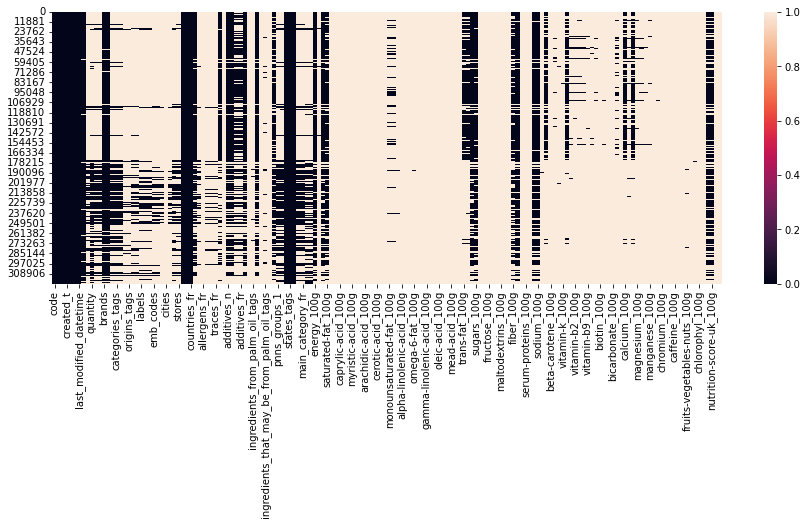

In [13]:
#visualiser les valeurs manquantes
plt.figure(figsize=(15,5))
sns.heatmap(data_foodfacts.isna(), cbar=True)

In [14]:
(data_foodfacts.isna().sum()/data_foodfacts.shape[0]).sort_values(ascending=True)

last_modified_t                          0.000000
last_modified_datetime                   0.000000
creator                                  0.000006
created_t                                0.000009
created_datetime                         0.000028
                                           ...   
ingredients_that_may_be_from_palm_oil    1.000000
ingredients_from_palm_oil                1.000000
no_nutriments                            1.000000
nervonic-acid_100g                       1.000000
water-hardness_100g                      1.000000
Length: 162, dtype: float64

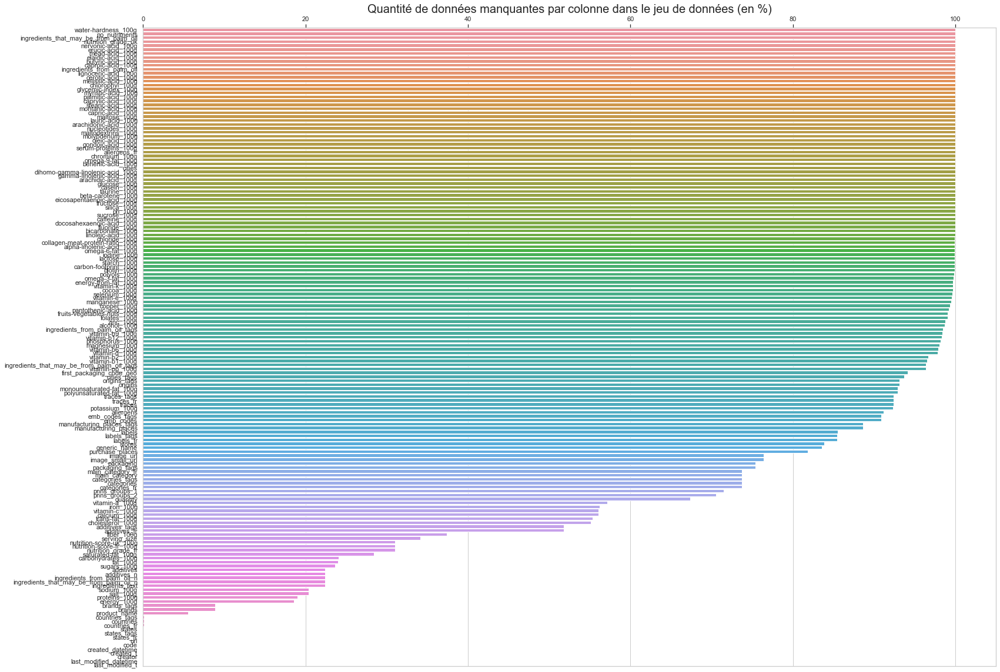

In [15]:
proportion_nan = data_foodfacts.isna().sum().divide(data_foodfacts.shape[0]/100).sort_values(ascending=False)

sns.set(style="whitegrid")
plt.figure(figsize=(26, 20))
ax = sns.barplot(y = proportion_nan.index, x=proportion_nan.values)
ax.xaxis.set_ticks_position('top')
plt.title('Quantité de données manquantes par colonne dans le jeu de données (en %)', size=20)
plt.show()

On remarque qu'il y a beaucoup des variables qui ne sont pas assez remplis donc on va supprimer les variables qui ont un taux de remlissage < 75%

In [16]:
def supprim_nan(df,pourcentage):
    return df[df.columns[df.isna().sum()/df.shape[0] < pourcentage]]

In [17]:
data_foodfacts = supprim_nan(data_foodfacts, 0.75)
data_foodfacts

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,quantity,brands,...,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,1kg,Ferme t'y R'nao,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,3.6,3.57,0.00000,0.000,0.0,0.0214,0.000,0.00129,14.0,14.0
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,Torn & Glasser,...,7.1,17.86,0.63500,0.250,0.0,0.0000,0.071,0.00129,0.0,0.0
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,Grizzlies,...,7.1,17.86,1.22428,0.482,NaN,NaN,0.143,0.00514,12.0,12.0
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,Bob's Red Mill,...,5.7,8.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320767,9948282780603,http://world-fr.openfoodfacts.org/produit/9948...,openfoodfacts-contributors,1490631299,2017-03-27T16:14:59Z,1491244498,2017-04-03T18:34:58Z,Tomato & ricotta,1,Panzani,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,http://world-fr.openfoodfacts.org/produit/9956...,usda-ndb-import,1489059076,2017-03-09T11:31:16Z,1491244499,2017-04-03T18:34:59Z,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",NaN,Trader Joe's,...,0.0,0.00,0.00000,0.000,0.0,0.0000,0.000,0.00000,0.0,0.0
320769,9970229501521,http://world-fr.openfoodfacts.org/produit/9970...,tomato,1422099377,2015-01-24T11:36:17Z,1491244499,2017-04-03T18:34:59Z,乐吧泡菜味薯片,50 g,乐吧,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320770,9980282863788,http://world-fr.openfoodfacts.org/produit/9980...,openfoodfacts-contributors,1492340089,2017-04-16T10:54:49Z,1492340089,2017-04-16T10:54:49Z,Tomates aux Vermicelles,67g,Knorr,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
data_foodfacts.shape

(320772, 50)

##### Apres la suppresion qui contient un taux de remlissage <75% il nous reste 50 variables 

# 1.Sélection de nos variables pertinentes 

In [19]:
#Affichege de tous les colonnes
data_foodfacts.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'quantity',
       'brands', 'brands_tags', 'categories', 'categories_tags',
       'categories_fr', 'countries', 'countries_tags', 'countries_fr',
       'ingredients_text', 'serving_size', 'additives_n', 'additives',
       'additives_tags', 'additives_fr', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_fr',
       'main_category', 'main_category_fr', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'trans-fat_100g', 'cholesterol_100g',
       'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
       'salt_100g', 'sodium_100g', 'vitamin-a_100g', 'vitamin-c_100g',
       'calcium_100g', 'iron_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g'],
      dtype='object')

Maintenant on va selectionner les variables importantes parmis ces 50 variables 
 

In [20]:
# Choix de 20 variables
data_food_global = data_foodfacts.loc[:, ['code', 'last_modified_datetime','pnns_groups_1','saturated-fat_100g',
'product_name', 'brands', 'countries_fr','ingredients_text',
'serving_size','calcium_100g','nutrition_grade_fr',
'energy_100g', 'fat_100g','carbohydrates_100g', 'sugars_100g', 'fiber_100g',
'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']]

In [21]:
data_food_global.shape

(320772, 20)

In [22]:
# Affichage des colonnes 
data_food_global.columns

Index(['code', 'last_modified_datetime', 'pnns_groups_1', 'saturated-fat_100g',
       'product_name', 'brands', 'countries_fr', 'ingredients_text',
       'serving_size', 'calcium_100g', 'nutrition_grade_fr', 'energy_100g',
       'fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g'],
      dtype='object')

In [23]:
data_food_global.dtypes

code                        object
last_modified_datetime      object
pnns_groups_1               object
saturated-fat_100g         float64
product_name                object
brands                      object
countries_fr                object
ingredients_text            object
serving_size                object
calcium_100g               float64
nutrition_grade_fr          object
energy_100g                float64
fat_100g                   float64
carbohydrates_100g         float64
sugars_100g                float64
fiber_100g                 float64
proteins_100g              float64
salt_100g                  float64
sodium_100g                float64
nutrition-score-fr_100g    float64
dtype: object

In [24]:
nutriments_labels = ['saturated-fat_100g',
                     'calcium_100g',
                     'energy_100g',
                     'fat_100g',
                     'carbohydrates_100g',
                     'sugars_100g',
                     'fiber_100g',
                     'proteins_100g',
                     'salt_100g',
                     'sodium_100g',
                     'nutrition-score-fr_100g']

In [25]:
# on va filtrer nos données pour conserver juste les produits vendus en France
produit_vendus_en_france= (data_food_global['countries_fr']=='France')
data_food_global[produit_vendus_en_france]

,code,last_modified_datetime,pnns_groups_1,saturated-fat_100g,product_name,brands,countries_fr,ingredients_text,serving_size,calcium_100g,nutrition_grade_fr,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
0,0000000003087,2016-09-17T09:18:13Z,NaN,NaN,Farine de blé noir,Ferme t'y R'nao,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,0000000024600,2015-06-17T10:11:54Z,unknown,NaN,Filet de bœuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48,0000000027205,2016-03-17T18:17:18Z,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
136,0000000039259,2016-09-10T20:08:02Z,unknown,NaN,Twix x2,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
182,0000005200016,2015-09-18T10:05:52Z,Cereals and potatoes,NaN,lentilles vertes,Bertrand Lejeune,France,lentilles vertes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320761,9906410000009,2016-01-03T20:00:15Z,NaN,NaN,Roussette du Bugey (2011),Roussette du Bugey,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320763,99111250,2013-06-20T01:09:16Z,Beverages,0.2,Thé vert Earl grey,Lobodis,France,"thé vert, arôme naturel bergamote avec autres ...",NaN,NaN,c,21.0,0.2,0.5,0.5,0.2,0.5,0.0254,0.01,2.0
320764,9918,2015-04-27T20:53:12Z,NaN,NaN,"Cheese cake thé vert, yuzu",NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320765,9935010000003,2015-11-01T11:20:39Z,Fish Meat Eggs,NaN,Rillette d'oie,"Sans marque,D.Lambert",France,"viande d'oie, graisse de canard, épices, sel, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
data_food_fr = data_food_global[produit_vendus_en_france]
data_food_fr.shape

(94392, 20)

<AxesSubplot:>

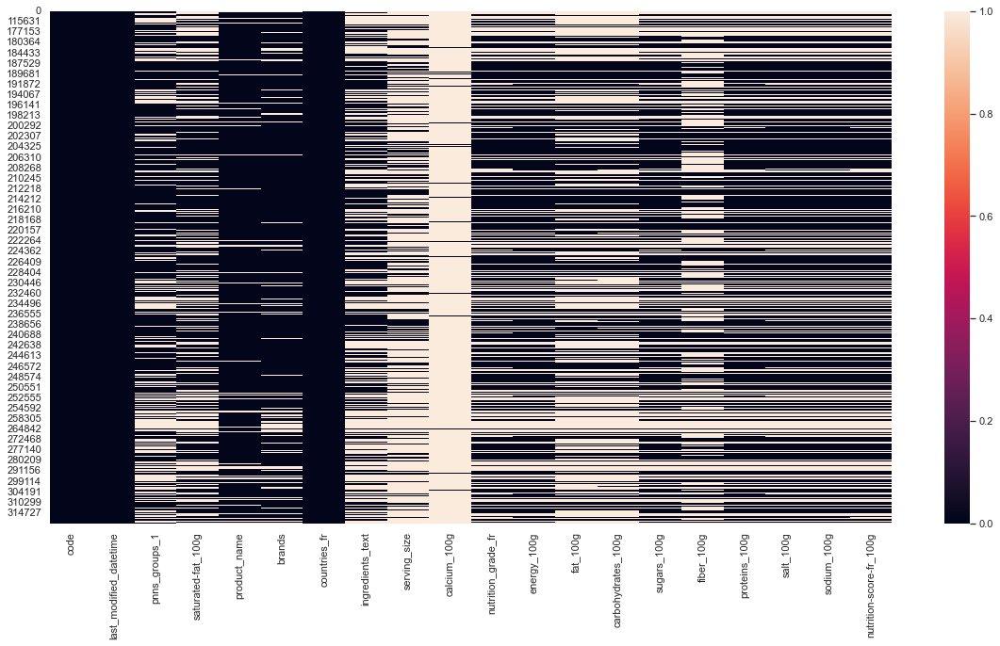

In [27]:
#Visualiser les valeurs manquantes
plt.figure(figsize=(20,10))
sns.heatmap(data_food_fr.isna(), cbar=True)

In [28]:
data_food_1 = data_food_fr.copy()

In [29]:
def data_count_percent(dataframe):
    for col in nutriments_labels:
        Data_Count_percent = pd.DataFrame({
            'count': dataframe.isna().sum(),
            'percent': 100 * dataframe.isna().sum() / dataframe.shape[0]})
        # Transposition de la data
        
    return Data_Count_percent

In [30]:
Data_per_NaN = data_count_percent(data_food_1)
Data_per_NaN

,count,percent
code,0,0.000000
last_modified_datetime,0,0.000000
pnns_groups_1,32757,34.703153
saturated-fat_100g,35002,37.081532
product_name,6994,7.409526
brands,11862,12.566743
countries_fr,0,0.000000
ingredients_text,43900,46.508179
serving_size,70121,74.287016
calcium_100g,92482,97.976523


In [31]:
Data_per_NaN.transpose()
fig = px.bar(Data_per_NaN, y='percent', text_auto='.2s',color='count',
            title='Le pourcentage des NaN pour chaque variable avant traitement')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

#### Sur ce graphique , on observe le pourcentage des NaN de chaque variables , et on remarque que  que la categorie  serving_size est à  74% de NaN et le calcuim est à  98%

# 2.Detection et remplacement  des valeurs abérrantes par des NaN

Dans cette partie, j'utilise deux methodes: la methode metier et la methode interquartile ensuite je compare les deux methodes.

In [32]:
data = data_food_fr.copy()

### 2.1 Le nombre de valeurs aberrantes detecter par la methode metier


In [33]:
def detect_outlier(dataframe, colonnes):
    
    for col in colonnes:
        # je calcule les valeurs abberantes avec la limite 100 et min = 0 pour tout les nuttriment sauf energy
        nombre_aberrantes_sauf_energie = (dataframe[colonnes].drop(columns='energy_100g')>100).sum() + (dataframe[colonnes].drop(columns='energy_100g')<0).sum()
        #L'energie n'a pas la même limite que les autres, le max = 3700g et le min = 0
        nombre_aberrantes_sauf_energie['energy_100g']= (dataframe['energy_100g']<0).sum() + (dataframe['energy_100g'] >3700).sum()
        
    return nombre_aberrantes_sauf_energie

In [34]:
nombre_valeur_aberrantes = detect_outlier(data, nutriments_labels)

In [35]:
nombre_valeur_aberrantes.sort_values()

calcium_100g                  0
proteins_100g                 0
sodium_100g                   0
saturated-fat_100g            1
fiber_100g                    1
fat_100g                      2
salt_100g                     2
sugars_100g                   5
carbohydrates_100g            8
energy_100g                 253
nutrition-score-fr_100g    9857
dtype: int64

In [36]:
nombre_valeur_aberrantes.sum()

10129

In [37]:
# Pourcentage de valeur aberrantes detecter par le metier
Data_per_outlier = nombre_valeur_aberrantes*100/data.shape[0]
Data_per_outlier

saturated-fat_100g          0.001059
calcium_100g                0.000000
fat_100g                    0.002119
carbohydrates_100g          0.008475
sugars_100g                 0.005297
fiber_100g                  0.001059
proteins_100g               0.000000
salt_100g                   0.002119
sodium_100g                 0.000000
nutrition-score-fr_100g    10.442622
energy_100g                 0.268031
dtype: float64

On observe dans les outliers:

10% pour les nutrition score et peu de valeur detecter dans les autres variables

### 2.2 Remplacement  des outliers detecter par la methode metier


In [38]:
#Remplacement des outliers detecter par NaN : la methode metier
def suppre_outlier(dataframe, colonnes):
    for col in colonnes:
        if 'energy' not in col:
            dataframe.loc[dataframe[col] < 0] = np.nan
            dataframe.loc[dataframe[col] > 100] = np.nan
        
        else:
        
            dataframe.loc[dataframe[col] < 0] = np.nan
            dataframe.loc[dataframe[col] > 3700] = np.nan
    
    return dataframe

In [39]:
Traite_outlier_nan = suppre_outlier(data, nutriments_labels)


In [40]:
Traite_outlier_nan.describe()

,saturated-fat_100g,calcium_100g,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,49276.000000,1656.000000,51317.000000,37079.000000,36657.000000,49377.000000,34474.000000,51071.000000,49435.000000,49432.000000,48392.000000
mean,6.280413,0.372234,1171.174224,15.248331,27.581322,15.129016,2.085753,7.821791,1.321136,0.520163,11.052447
std,8.817998,2.007619,770.549982,17.386960,27.298552,20.197197,3.868284,8.037982,4.555790,1.793667,7.748022
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.500000,0.120000,493.000000,2.100000,3.500000,1.000000,0.000000,1.700000,0.100000,0.039370,4.000000
50%,2.800000,0.150000,1095.000000,9.800000,14.900000,5.000000,0.900000,5.900000,0.700000,0.275591,11.000000
75%,9.100000,0.400000,1739.000000,23.700000,53.000000,23.500000,2.700000,10.600000,1.400000,0.551181,17.000000
max,100.000000,69.500000,3700.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,39.370079,40.000000


#### On observe que le remplacement a bien été fait

In [41]:
data_metier = Traite_outlier_nan.copy()


In [42]:
data_metier = data_metier.drop_duplicates()


In [43]:
Data_per_NaN_00 = data_count_percent(data_metier)
Data_per_NaN_00

,count,percent
code,1,0.001187
last_modified_datetime,1,0.001187
pnns_groups_1,30654,36.374640
saturated-fat_100g,34997,41.528129
product_name,6949,8.245820
brands,11821,14.027031
countries_fr,1,0.001187
ingredients_text,40800,48.414083
serving_size,63872,75.791772
calcium_100g,82617,98.034958


In [44]:
Data_per_NaN_00.transpose()
fig = px.bar(Data_per_NaN_00, y='percent', text_auto='.2s',color='count',
            title='NaN pour chaque variable aprés traitement des outlier par la methode metier')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

### 2.3. Le nombre de valeurs aberrantes detecter par la methode interquartile

Expliquons ici la methode interquartile


L’IQR est utilisé pour mesurer la variabilité en divisant un ensemble de données en quartiles. Les données sont triées par ordre croissant et divisées en 4 parties égales. Q1, Q2, Q3 appelés premier, deuxième et troisième quartiles sont les valeurs qui séparent les 4 parties égales.

Q1 représente le 25e centile des données.
Q2 représente le 50e centile des données.
Q3 représente le 75e centile des données.

Si un jeu de données a 2n / 2n+1 points de données, alors
Q1 = médiane du jeu de données.
Q2 = médiane des n plus petits points de données.
Q3 = médiane des n points de données les plus élevés.

L’IQR est l’intervalle entre le premier et le troisième quartile à savoir Q1 et Q3 : IQR = Q3 – Q1 . Les points de données qui tombent en dessous de Q1 – 1,5 IQR ou au-dessus de Q3 + 1,5 IQR sont des valeurs aberrantes


In [45]:
#Algorithme permattant d'acceder à l'ensemble des valeurs aberrantes
def detect_outlier_interq(dataframe, colonnes):
    
    for col in colonnes:
        Q1 = dataframe[col].quantile(0.25)
        Q3 = dataframe[col].quantile(0.75)
        IQR = Q3-Q1
        print(col)
        Limite_inf = Q1 - (1.5 * IQR)
        print('Limite_inf',Limite_inf)
        Limite_sup = Q3 + (1.5 * IQR)
        print('Limite_sup',Limite_sup)
        nombre_aberrantes = (dataframe[colonnes]< Limite_inf).sum() + (dataframe[colonnes]> Limite_sup).sum()
        
    return nombre_aberrantes

In [47]:
#Le nombre de outlier detecter par la methode interquartile de chaque nutriment
nombr_outlier_interquartile = detect_outlier_interq(data, nutriments_labels)
nombr_outlier_interquartile.sort_values()

saturated-fat_100g
Limite_inf -12.399999999999999
Limite_sup 22.0
calcium_100g
Limite_inf -0.30000000000000004
Limite_sup 0.8200000000000001
energy_100g
Limite_inf -1376.0
Limite_sup 3608.0
fat_100g
Limite_inf -30.299999999999997
Limite_sup 56.099999999999994
carbohydrates_100g
Limite_inf -70.75
Limite_sup 127.25
sugars_100g
Limite_inf -32.75
Limite_sup 57.25
fiber_100g
Limite_inf -4.050000000000001
Limite_sup 6.750000000000001
proteins_100g
Limite_inf -11.650000000000002
Limite_sup 23.950000000000003
salt_100g
Limite_inf -1.8499999999999996
Limite_sup 3.3499999999999996
sodium_100g
Limite_inf -0.7283464566929136
Limite_sup 1.3188976377952761
nutrition-score-fr_100g
Limite_inf -15.5
Limite_sup 36.5


nutrition-score-fr_100g        1
calcium_100g                   2
sodium_100g                   43
fiber_100g                    58
salt_100g                    195
proteins_100g                230
saturated-fat_100g           584
fat_100g                    3135
sugars_100g                 7447
carbohydrates_100g         12818
energy_100g                50390
dtype: int64

In [48]:
nombr_outlier_interquartile.sum()

74903

In [49]:
(nombr_outlier_interquartile*100/data.shape[0]).sort_values()

nutrition-score-fr_100g     0.001059
calcium_100g                0.002119
sodium_100g                 0.045555
fiber_100g                  0.061446
salt_100g                   0.206585
proteins_100g               0.243665
saturated-fat_100g          0.618696
fat_100g                    3.321256
sugars_100g                 7.889440
carbohydrates_100g         13.579541
energy_100g                53.383761
dtype: float64

## On observe que en energy j'ai plus de 53%  de valeurs detecté.

Donc on peut conclure que la methode interquartile detecte des données qui ne sont  pas des outliers. 

Alors la methode metier est plus pertinente et je continuerai mon analyse avec les données traitées par la methode metier 

### 2.4 Remplacement des outlier par NaN par la methode interquartile

In [50]:
#Remplacement des outlier par NaN par la methode interquartile
def delete_outlier_quartile(dataframe,colonnes):

    for col in colonnes:
        Q1 = dataframe[col].quantile(0.25)
        Q3 = dataframe[col].quantile(0.75)
        IQR = Q3-Q1
        Limite_inf = Q1 - (1.5 * IQR)
        Limite_sup = Q3 + (1.5 * IQR)
        dataframe.loc[dataframe[col] < Limite_inf] = np.nan
        dataframe.loc[dataframe[col] > Limite_sup] = np.nan
        

    return(dataframe)  

In [51]:
data_sans_outlier_quartile = delete_outlier_quartile(data, nutriments_labels)


In [52]:
data_sans_outlier_quartile.describe()

,saturated-fat_100g,calcium_100g,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,37918.000000,1300.000000,39755.000000,29392.000000,29043.000000,38000.000000,26377.000000,39545.000000,38082.000000,38079.000000,37382.000000
mean,4.886521,0.201366,1017.224685,11.928195,26.552582,12.202804,1.389535,6.844091,0.803919,0.316527,9.854957
std,5.696525,0.166338,705.603492,11.520253,25.605437,14.949110,1.633916,6.092049,0.737160,0.290220,7.688363
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.500000,0.120000,410.000000,1.980000,4.700000,1.200000,0.000000,1.900000,0.101600,0.040000,3.000000
50%,2.500000,0.120000,900.000000,8.200000,15.000000,4.900000,0.800000,5.700000,0.700000,0.275591,9.000000
75%,7.500000,0.247000,1593.500000,20.800000,51.000000,18.000000,2.300000,9.400000,1.300000,0.511811,16.000000
max,22.000000,0.815000,3473.000000,52.100000,100.000000,57.400000,6.720000,24.200000,3.080000,1.212598,35.000000


In [53]:
quart_data = data_sans_outlier_quartile.copy()

In [54]:
quart_data = quart_data.drop_duplicates()

In [55]:
Data_per_NaN_11 = data_count_percent(quart_data)
Data_per_NaN_11

,count,percent
code,1,0.001377
last_modified_datetime,1,0.001377
pnns_groups_1,27408,37.739071
saturated-fat_100g,34707,47.789329
product_name,6903,9.504991
brands,11770,16.206540
countries_fr,1,0.001377
ingredients_text,36475,50.223752
serving_size,55359,76.225818
calcium_100g,71325,98.209983


In [56]:
Data_per_NaN_11.transpose()
fig = px.bar(Data_per_NaN_11, y='percent', text_auto='.2s',color='count',
            title='Le pourcentage des NaN pour chaque variable après filtrage interquartile')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

#### On observe une augmentation de NaN c'est tout à  fait logique car on a remplacer les outliers par des NaN

### 3. Traitement des valeurs manquantes

Pour le traitement des valeurs manquantes je passerai par plusieurs methode , chacun adapter à la variable
J'utiliserai 4 methodes:
- IterateImputer
- Remplacement par 0
- Suppression des NaN pour les variables categorielle
- Impution par KNN


In [57]:
quart_data.isna().sum()

code                           1
last_modified_datetime         1
pnns_groups_1              27408
saturated-fat_100g         34707
product_name                6903
brands                     11770
countries_fr                   1
ingredients_text           36475
serving_size               55359
calcium_100g               71325
nutrition_grade_fr         35243
energy_100g                32870
fat_100g                   43233
carbohydrates_100g         43582
sugars_100g                34625
fiber_100g                 46248
proteins_100g              33080
salt_100g                  34543
sodium_100g                34546
nutrition-score-fr_100g    35243
dtype: int64

### 3.1 Traitement des valeurs manquantes par la methode iterateImputer

La methode IterateImputer se base sur les variables corrélées entre eux, c'estpour ça on va calculer le coefficient de correlation entre les variables.

In [58]:
data_sans_outlier = quart_data.copy()

In [59]:
corr_dataframe = data_sans_outlier.corr()
corr_dataframe

,saturated-fat_100g,calcium_100g,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
saturated-fat_100g,1.000000,0.687913,0.606021,0.765794,0.177560,0.279504,0.106006,0.278805,0.096685,0.096665,0.741549
calcium_100g,0.687913,1.000000,0.590106,0.641735,0.148723,0.058094,0.366147,0.786810,0.709382,0.709401,0.581587
energy_100g,0.606021,0.590106,1.000000,0.789508,0.717960,0.468730,0.467942,0.253260,0.162906,0.162932,0.715604
fat_100g,0.765794,0.641735,0.789508,1.000000,0.194625,0.210805,0.349221,0.292968,0.262531,0.262508,0.691157
carbohydrates_100g,0.177560,0.148723,0.717960,0.194625,1.000000,0.644993,0.589168,-0.139896,-0.148224,-0.148164,0.421618
sugars_100g,0.279504,0.058094,0.468730,0.210805,0.644993,1.000000,0.246829,-0.225722,-0.381532,-0.381561,0.532541
fiber_100g,0.106006,0.366147,0.467942,0.349221,0.589168,0.246829,1.000000,0.075410,0.113010,0.113141,0.103323
proteins_100g,0.278805,0.786810,0.253260,0.292968,-0.139896,-0.225722,0.075410,1.000000,0.562166,0.562210,0.159194
salt_100g,0.096685,0.709382,0.162906,0.262531,-0.148224,-0.381532,0.113010,0.562166,1.000000,1.000000,0.201089
sodium_100g,0.096665,0.709401,0.162932,0.262508,-0.148164,-0.381561,0.113141,0.562210,1.000000,1.000000,0.201089


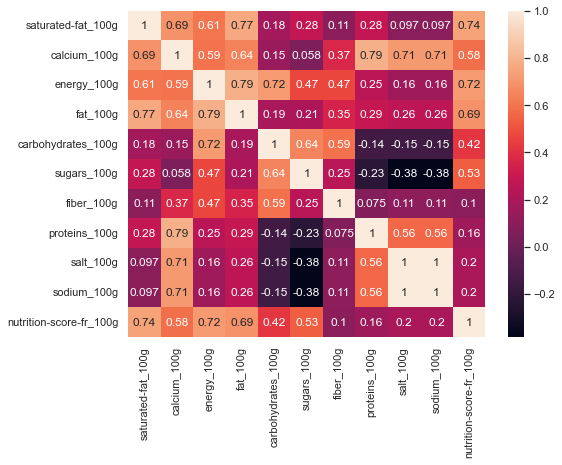

In [60]:
plt.figure(figsize=(8, 6))
sns.heatmap(corr_dataframe, annot=True)
plt.show()

On remarque ici que :
- La variables energy est fortement correlée avec : saturated, fat, carbonhydrate, et nutriscore
- La variable fat_100 est fortement correlée avec : saturated, energiy, et nutriscore
- La variable carbohydrate est fortement correlée avec: sucre
- La variable surce est fortement correlée avec: carbohydrate, nutriscore,calcium
- La variable nutriscore est fortement correlée avec: satured, energy, fat, sucre,calcium
- la variable calcium est fortement correlée avec: nutriscore,

In [61]:
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer

In [62]:
colum_corre = ['fat_100g', 'saturated-fat_100g', 'energy_100g','proteins_100g','carbohydrates_100g','sodium_100g','nutrition-score-fr_100g']
imputerimputer = IterativeImputer()
data_sans_outlier[colum_corre] = imputerimputer.fit_transform(data_sans_outlier[colum_corre])


C:\Users\yosra\anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning:

[IterativeImputer] Early stopping criterion not reached.



In [63]:
data_sans_outlier.isna().sum()

code                           1
last_modified_datetime         1
pnns_groups_1              27408
saturated-fat_100g             0
product_name                6903
brands                     11770
countries_fr                   1
ingredients_text           36475
serving_size               55359
calcium_100g               71325
nutrition_grade_fr         35243
energy_100g                    0
fat_100g                       0
carbohydrates_100g             0
sugars_100g                34625
fiber_100g                 46248
proteins_100g                  0
salt_100g                  34543
sodium_100g                    0
nutrition-score-fr_100g        0
dtype: int64

In [64]:
Data_per_NaN_2 = data_count_percent(data_sans_outlier)

In [65]:
Data_per_NaN_2.transpose()
fig = px.bar(Data_per_NaN_2, y='percent', text_auto='.2s',color='count',
            title='Pourcentage des NaN après filtrage interquartile')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

### Après l'application de iterate imputer sur mes données , on observe que l'histogramme se remplise petit à petit

### 3.2. Remplacement des NaN par la médiane des variables:

### On observe le boxplot du sel, sucre, et fibre , on observe que la mediane n'est pas nul
alors on remplace les NaN de : 
- sel, 
- sucre  
- fibre 
 par leur median


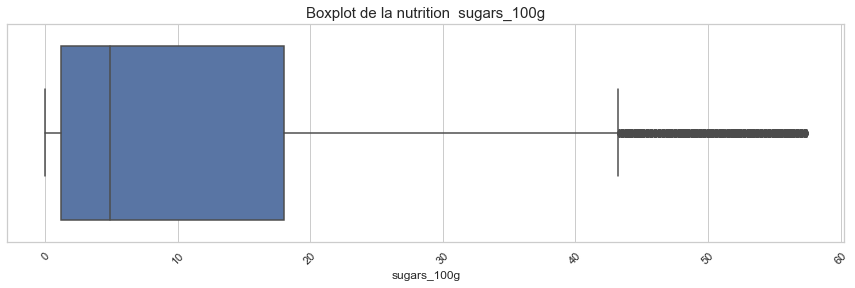

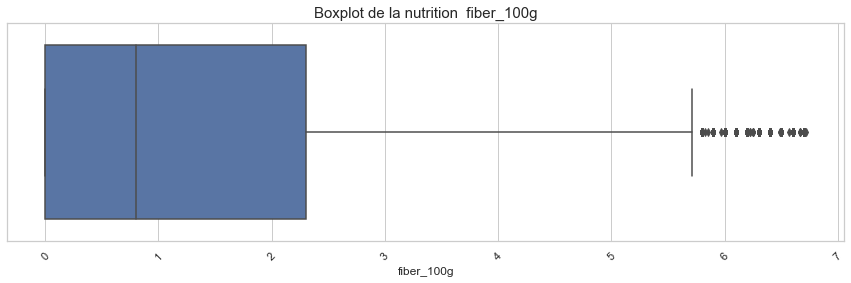

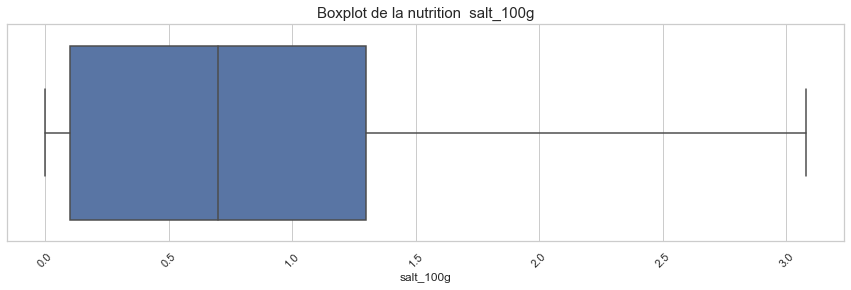

In [66]:
sns.set(font_scale=2)
for column in ['sugars_100g', 'fiber_100g', 'salt_100g']:
   
    sns.set(style="whitegrid")
    plt.figure(figsize=(15, 4))
    plt.xticks(rotation=45)
    plt.title('Boxplot de la nutrition  ' + column , size=15)
    sns.boxplot(x = column, data = data_sans_outlier)
    #chaine = 'Analyse Univarié de: ' + column + ' par categories de produit '
    plt.show()
sns.set(font_scale=1)

In [67]:
Nutritive = ['sugars_100g', 'fiber_100g', 'salt_100g']

In [69]:
 data_sans_outlier

In [158]:
for cols in data_sans_outlier[Nutritive]:
        df_median[cols].fillna(df_median.groupby('pnns_groups_1')[cols].transform('median'), inplace=True)

In [159]:
data_sans_outlier.isna().sum()

code                           0
last_modified_datetime         0
pnns_groups_1                  0
saturated-fat_100g             0
product_name                   0
brands                         0
countries_fr                   0
ingredients_text               0
serving_size                   0
calcium_100g               13686
nutrition_grade_fr             0
energy_100g                    0
fat_100g                       0
carbohydrates_100g             0
sugars_100g                    0
fiber_100g                     0
proteins_100g                  0
salt_100g                      0
sodium_100g                    0
nutrition-score-fr_100g        0
dtype: int64

In [160]:
Data_per_NaN_3 = data_count_percent(data_sans_outlier)


In [161]:
Data_per_NaN_3.transpose()
fig = px.bar(Data_per_NaN_3, y='percent', text_auto='.2s',color='count',
            title='Remplacement des NaN par le median des variables')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

### 3.3. Suppression des Nan variables categorielle : 

- code
- last_modified_datetime
- pnns_groups_1
- product_name
- brands
- countries_fr
- ingredients_text
- serving_size 
- nutrition_grade_fr

In [162]:
Nutritive_nan_sup= ['code','last_modified_datetime','pnns_groups_1', 'product_name', 'brands', 'countries_fr','ingredients_text','serving_size','nutrition_grade_fr']

In [163]:
data_sans_outlier.dropna(subset= Nutritive_nan_sup, inplace=True)


In [164]:
data_sans_outlier.isna().sum()

code                           0
last_modified_datetime         0
pnns_groups_1                  0
saturated-fat_100g             0
product_name                   0
brands                         0
countries_fr                   0
ingredients_text               0
serving_size                   0
calcium_100g               13686
nutrition_grade_fr             0
energy_100g                    0
fat_100g                       0
carbohydrates_100g             0
sugars_100g                    0
fiber_100g                     0
proteins_100g                  0
salt_100g                      0
sodium_100g                    0
nutrition-score-fr_100g        0
dtype: int64

In [165]:
Data_per_NaN_4 = data_count_percent(data_sans_outlier)


In [166]:
Data_per_NaN_4.transpose()
fig = px.bar(Data_per_NaN_4, y='percent', text_auto='.2s',color='count',
            title='Remplacement des NaN par 0 pour les variables catégorielles variables')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

### 3.4. Imputation par la methode KNN:

- calcium 
pour predire le calcium

In [167]:
from sklearn.impute import KNNImputer

In [168]:
variable_autre = ['code', 'last_modified_datetime', 'pnns_groups_1','saturated-fat_100g', 'product_name',
       'brands', 'countries_fr', 'ingredients_text', 'serving_size', 'nutrition_grade_fr', 'energy_100g',
       'fat_100g', 'carbohydrates_100g','sodium_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'nutrition-score-fr_100g']

In [169]:
imputer = KNNImputer(n_neighbors=3)
imputed = imputer.fit_transform(data_sans_outlier.filter(regex='calcium_100g'))
df_imputed = pd.DataFrame(imputed, columns = data_sans_outlier.filter(regex='calcium_100g').columns)

In [170]:
df_imputed

,calcium_100g
0,0.208189
1,0.208189
2,0.208189
3,0.208189
4,0.208189
...,...
14409,0.208189
14410,0.208189
14411,0.208189
14412,0.208189


In [171]:
data_clean = pd.concat([data_sans_outlier[variable_autre].reset_index(drop=True), df_imputed.reset_index(drop = True)], axis=1)


In [172]:
data_clean

,code,last_modified_datetime,pnns_groups_1,saturated-fat_100g,product_name,brands,countries_fr,ingredients_text,serving_size,nutrition_grade_fr,energy_100g,fat_100g,carbohydrates_100g,sodium_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,calcium_100g
0,0000040608754,2015-08-09T17:35:31Z,Beverages,0.0,"Pepsi, Nouveau goût !",Pepsi,France,"Eau gazéifiée, sucre, colorant caramel E150d, ...",150ml,e,177.0,0.0,10.4,0.010000,10.4,0.0,0.0,0.025400,13.0,0.208189
1,0000087177756,2015-06-06T11:13:26Z,Beverages,0.0,7Up,"7Up,Pepsico",France,"Eau gazéifiée, sucre, acidifiants (acide citri...",33 cl,e,177.0,0.0,10.4,0.039370,10.4,0.8,0.0,0.100000,13.0,0.208189
2,000010,2016-10-20T09:14:39Z,Sugary snacks,2.5,Madeleines nature,Bijou,France,"Farine de _blé_, huile de colza, sucre, _oeufs...",17.6g,d,1900.0,23.0,55.0,0.259843,26.0,1.5,6.0,0.660000,12.0,0.208189
3,000030,2016-12-15T22:24:04Z,Sugary snacks,2.5,Cakes Raisins,Bijou,France,"Farine de _blé_, _œufs_ frais, huile de colza,...",30 g,d,1768.0,19.0,56.0,0.255906,28.0,1.8,5.8,0.650000,13.0,0.208189
4,000031,2016-08-18T20:16:30Z,Sugary snacks,2.0,Cakes aux Fruits,Bijou,France,"Fruits 37.4% [fruits confits 21,5% [fruits (pa...",30 g,d,1670.0,15.0,60.0,0.236220,34.0,1.5,4.9,0.600000,12.0,0.208189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14409,9310072000480,2017-02-01T21:24:09Z,Sugary snacks,7.3,Sao,Arnott's,France,"Farine de _blé_, huile végétale, sel, levure d...","25,8 g (3 biscuits)",d,1900.0,15.1,67.0,0.700000,1.1,3.7,10.0,1.778000,14.0,0.208189
14410,9312937129602,2017-03-23T15:25:20Z,Beverages,0.0,Goji berry,The Berry Company,France,"Water, fruit juices from concentrate and press...",250 ml,c,206.0,0.2,11.5,0.000000,10.3,0.8,0.0,0.000000,4.0,0.208189
14411,9556041608251,2016-02-25T13:54:27Z,Beverages,18.0,Lait de Coco,Ayam,France,extrait de noix de coco d'Indonésie ou de Mala...,100 ml,d,862.0,20.0,3.4,0.019700,2.7,0.5,2.1,0.050038,12.0,0.208189
14412,9556417639339,2017-03-31T22:18:54Z,Cereals and potatoes,1.0,Mantou Sandwich,PA Food,France,"Farine de _blé_ (55.35%), eau (26.6%), sucre, ...",25 g (bun),b,1218.0,2.0,60.0,0.023622,14.0,0.3,8.0,0.060000,2.0,0.208189


In [173]:
data_clean.isna().sum()

code                       0
last_modified_datetime     0
pnns_groups_1              0
saturated-fat_100g         0
product_name               0
brands                     0
countries_fr               0
ingredients_text           0
serving_size               0
nutrition_grade_fr         0
energy_100g                0
fat_100g                   0
carbohydrates_100g         0
sodium_100g                0
sugars_100g                0
fiber_100g                 0
proteins_100g              0
salt_100g                  0
nutrition-score-fr_100g    0
calcium_100g               0
dtype: int64

<AxesSubplot:>

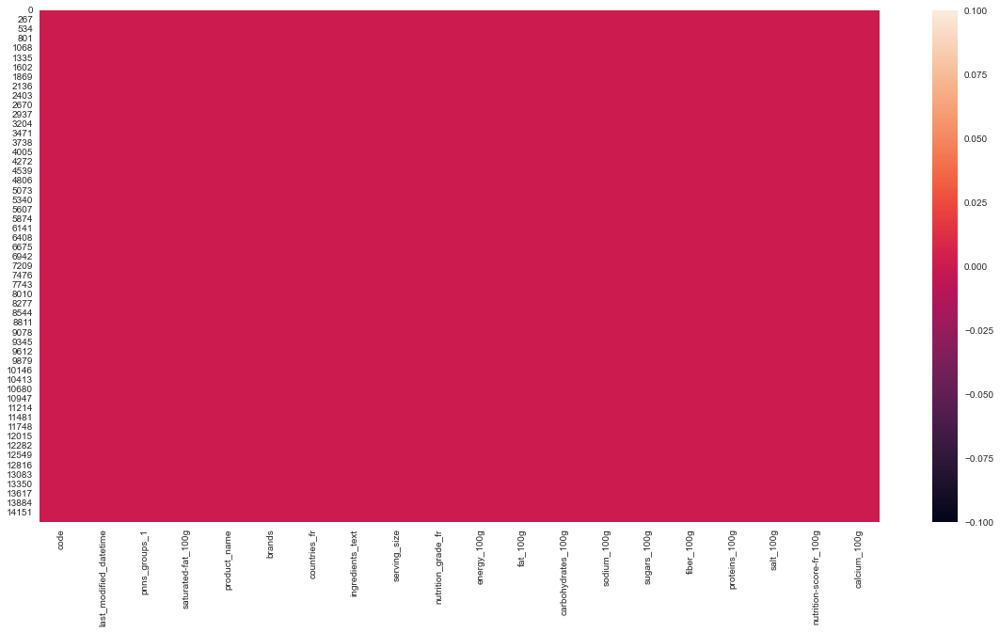

In [174]:
#Visualiser les valeurs manquantes
plt.figure(figsize=(20,10))
sns.heatmap(data_clean.isna(), cbar=True)

On remarque içi qu'on a bien nettoyer notre base de données

## Exportation du dataframe sous le nom: 
Notebook_nettoyage

In [175]:
data_clean.to_csv( 'Notebook_nettoyage.csv', index=False)


In [176]:
data_clean.dtypes

code                        object
last_modified_datetime      object
pnns_groups_1               object
saturated-fat_100g         float64
product_name                object
brands                      object
countries_fr                object
ingredients_text            object
serving_size                object
nutrition_grade_fr          object
energy_100g                float64
fat_100g                   float64
carbohydrates_100g         float64
sodium_100g                float64
sugars_100g                float64
fiber_100g                 float64
proteins_100g              float64
salt_100g                  float64
nutrition-score-fr_100g    float64
calcium_100g               float64
dtype: object

In [177]:
data_clean.shape

(14414, 20)

In [178]:
data_clean.duplicated().sum()

0

In [179]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14414 entries, 0 to 14413
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   code                     14414 non-null  object 
 1   last_modified_datetime   14414 non-null  object 
 2   pnns_groups_1            14414 non-null  object 
 3   saturated-fat_100g       14414 non-null  float64
 4   product_name             14414 non-null  object 
 5   brands                   14414 non-null  object 
 6   countries_fr             14414 non-null  object 
 7   ingredients_text         14414 non-null  object 
 8   serving_size             14414 non-null  object 
 9   nutrition_grade_fr       14414 non-null  object 
 10  energy_100g              14414 non-null  float64
 11  fat_100g                 14414 non-null  float64
 12  carbohydrates_100g       14414 non-null  float64
 13  sodium_100g              14414 non-null  float64
 14  sugars_100g           

In [180]:
data_clean.describe()

,saturated-fat_100g,energy_100g,fat_100g,carbohydrates_100g,sodium_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,calcium_100g
count,14414.000000,14414.000000,14414.000000,14414.000000,14414.000000,14414.000000,14414.000000,14414.000000,14414.000000,14414.000000,14414.000000
mean,4.750952,1043.878702,11.620623,28.696812,0.318586,12.429017,1.419093,6.930117,0.809550,9.775496,0.208189
std,5.368883,703.189017,10.932016,25.183575,0.277306,14.485336,1.391265,5.711140,0.704272,7.578967,0.036423
min,-0.512438,0.000000,-3.026823,-1.291747,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.700000,439.000000,2.500000,7.000000,0.051181,1.500000,0.800000,3.000000,0.130000,3.000000,0.208189
50%,2.500000,926.000000,8.100000,18.900000,0.283465,5.500000,0.800000,6.000000,0.720000,9.000000,0.208189
75%,7.100000,1674.000000,20.000000,52.300000,0.511811,19.900000,1.900000,9.000000,1.300000,15.000000,0.208189
max,22.000000,3017.000000,52.000000,99.300000,1.212598,57.200000,6.700000,24.200000,3.080000,35.000000,0.815000


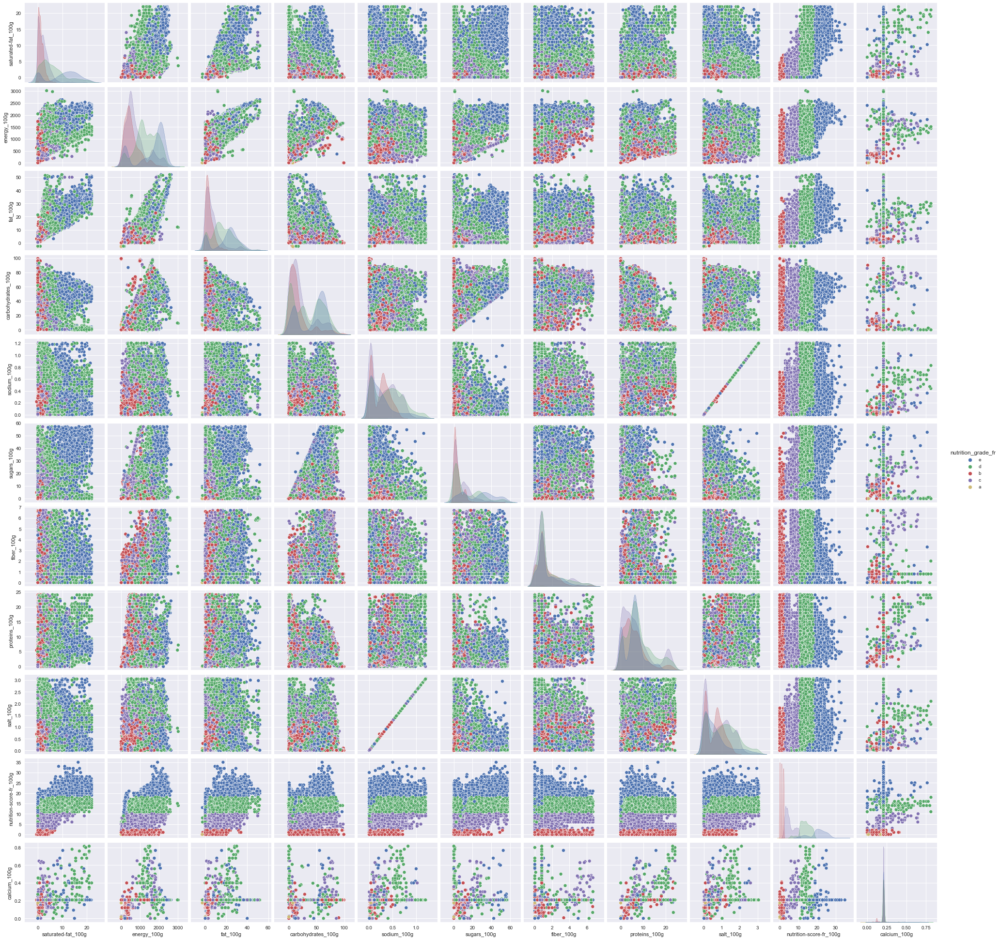

In [181]:
sns.pairplot(data_clean, hue='nutrition_grade_fr')

ce graphe montre la repartition du nutregrade par rapport a toute les variables 

# 3.Analyse exploratoire

# 3.1.Analyse univariée 


## variable categorielle

In [182]:
data_clean['nutrition_grade_fr'].value_counts()


c    4396
d    4170
b    3006
e    2821
a      21
Name: nutrition_grade_fr, dtype: int64

In [183]:
data_clean['nutrition_grade_fr'].value_counts(normalize=True)*100

c    30.498127
d    28.930207
b    20.854725
e    19.571250
a     0.145692
Name: nutrition_grade_fr, dtype: float64

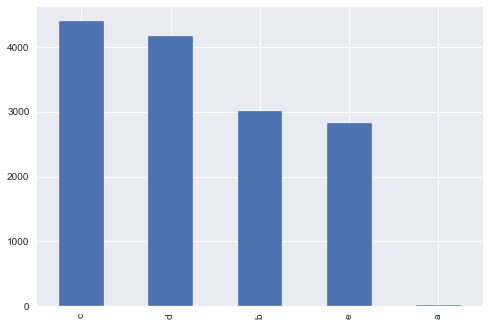

In [184]:
data_clean['nutrition_grade_fr'].value_counts().plot(kind = 'bar');


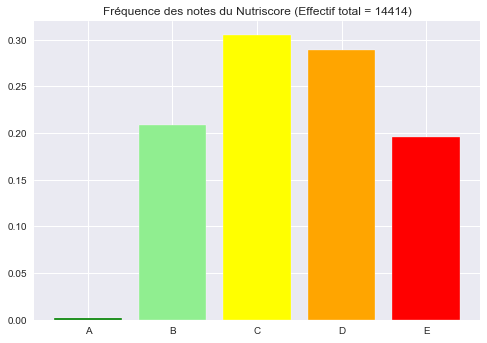

In [185]:
# barplot normalisé
br = data_clean['nutrition_grade_fr'].value_counts(normalize=True).sort_index()
plt.style.use('seaborn')
plt.bar(br.index,
       br.values,
        color=['green', 'lightgreen', 'yellow', 'orange', 'red'])
plt.title(
    label=
    f"Fréquence des notes du Nutriscore (Effectif total = {str(data_clean['nutrition_grade_fr'].notnull().sum())})"
)
plt.xticks(ticks=[0, 1, 2, 3, 4], labels=['A', 'B', 'C', 'D', 'E'])
plt.show()

<AxesSubplot:ylabel='nutrition_grade_fr'>

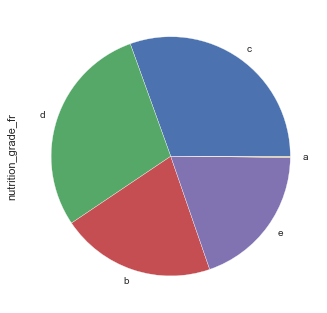

In [186]:
data_clean['nutrition_grade_fr'].value_counts().plot.pie()

In [187]:
data_clean['pnns_groups_1']


0                   Beverages
1                   Beverages
2               Sugary snacks
3               Sugary snacks
4               Sugary snacks
                 ...         
14409           Sugary snacks
14410               Beverages
14411               Beverages
14412    Cereals and potatoes
14413               Beverages
Name: pnns_groups_1, Length: 14414, dtype: object

In [188]:
data_clean['pnns_groups_1'].value_counts()

Sugary snacks              2664
Composite foods            2327
Milk and dairy products    2052
Beverages                  1717
Fish Meat Eggs             1478
unknown                    1196
Cereals and potatoes       1134
Salty snacks                875
Fat and sauces              381
Fruits and vegetables       311
sugary-snacks               233
fruits-and-vegetables        46
Name: pnns_groups_1, dtype: int64

In [189]:
data_clean['pnns_groups_1'].value_counts().sort_index()


Beverages                  1717
Cereals and potatoes       1134
Composite foods            2327
Fat and sauces              381
Fish Meat Eggs             1478
Fruits and vegetables       311
Milk and dairy products    2052
Salty snacks                875
Sugary snacks              2664
fruits-and-vegetables        46
sugary-snacks               233
unknown                    1196
Name: pnns_groups_1, dtype: int64

In [190]:
# suppression des 'unknown' pour faciliter la normalisation
df = data_clean['pnns_groups_1'].copy()
df = df[df != 'unknown']
df = df.value_counts(normalize=True).sort_index(ascending=False)
df

sugary-snacks              0.017627
fruits-and-vegetables      0.003480
Sugary snacks              0.201543
Salty snacks               0.066198
Milk and dairy products    0.155243
Fruits and vegetables      0.023529
Fish Meat Eggs             0.111817
Fat and sauces             0.028824
Composite foods            0.176048
Cereals and potatoes       0.085792
Beverages                  0.129899
Name: pnns_groups_1, dtype: float64

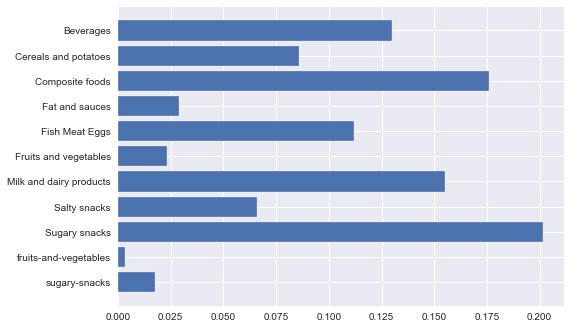

In [191]:
# barplot normalisé
plt.style.use('seaborn')
plt.barh(df.index, df.values)
plt.xticks()  #(rotation=0)
plt.show()

In [192]:
data_clean['pnns_groups_1'].value_counts(normalize=True)*100

Sugary snacks              18.482031
Composite foods            16.144027
Milk and dairy products    14.236159
Beverages                  11.912030
Fish Meat Eggs             10.253920
unknown                     8.297489
Cereals and potatoes        7.867351
Salty snacks                6.070487
Fat and sauces              2.643263
Fruits and vegetables       2.157625
sugary-snacks               1.616484
fruits-and-vegetables       0.319134
Name: pnns_groups_1, dtype: float64

<AxesSubplot:>

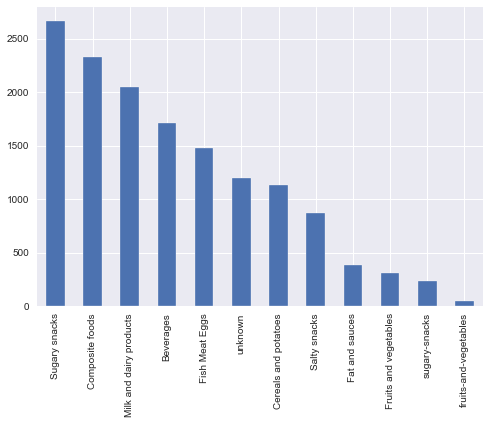

In [193]:
data_clean['pnns_groups_1'].value_counts().plot(kind = 'bar')

<AxesSubplot:ylabel='pnns_groups_1'>

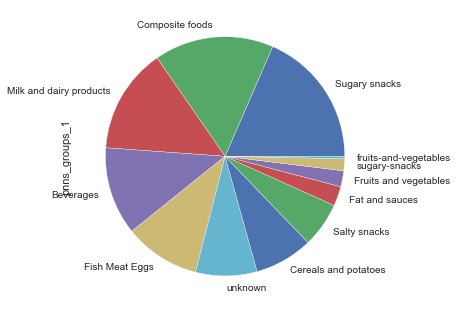

In [194]:
data_clean['pnns_groups_1'].value_counts().plot.pie()

In [195]:
data_clean['nutrition-score-fr_100g'].value_counts(normalize=True)*100


2.0     7.721659
3.0     7.499653
0.0     7.263771
1.0     7.118080
4.0     6.736506
13.0    4.606632
14.0    4.585819
5.0     4.585819
12.0    4.460941
11.0    4.454003
15.0    3.670043
16.0    3.260719
10.0    2.934647
9.0     2.927709
17.0    2.872208
8.0     2.726516
6.0     2.560011
18.0    2.490634
19.0    2.407382
21.0    2.157625
20.0    2.081310
7.0     1.998057
22.0    1.963369
23.0    1.699736
24.0    1.456917
25.0    1.408353
26.0    1.234911
27.0    0.693770
28.0    0.270570
29.0    0.041626
32.0    0.041626
30.0    0.034688
33.0    0.013875
31.0    0.013875
35.0    0.006938
Name: nutrition-score-fr_100g, dtype: float64

## Distrubtion des variables Numériques 

In [196]:
## Boite a moustache

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



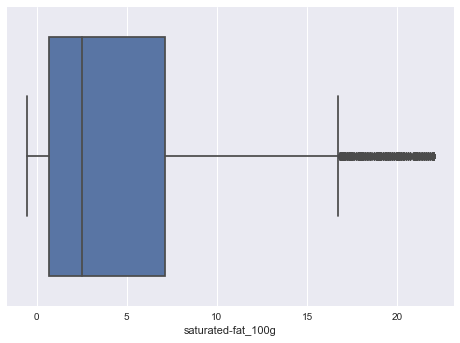

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



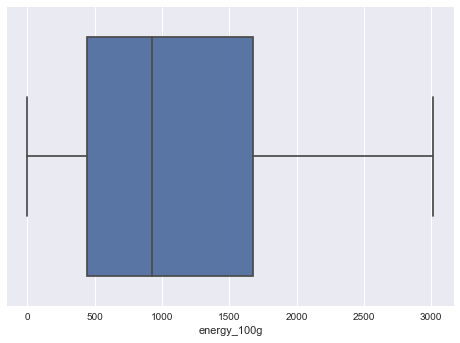

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



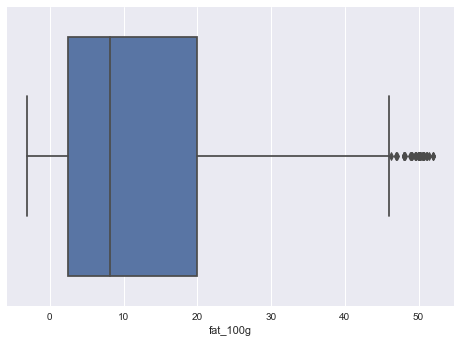

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



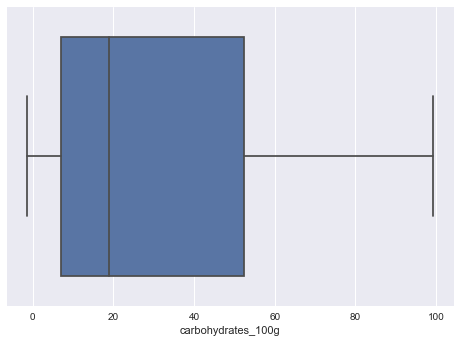

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



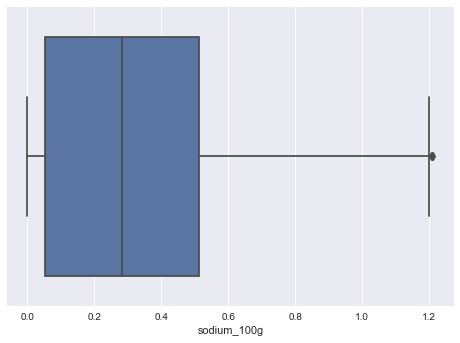

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



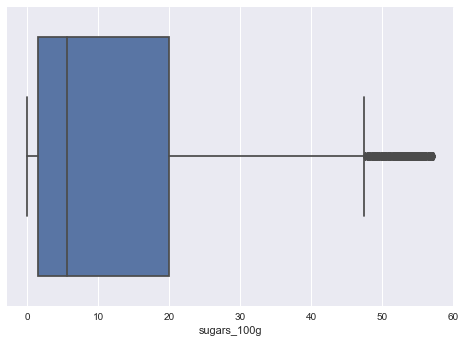

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



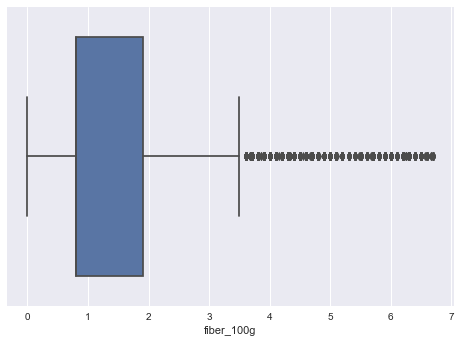

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



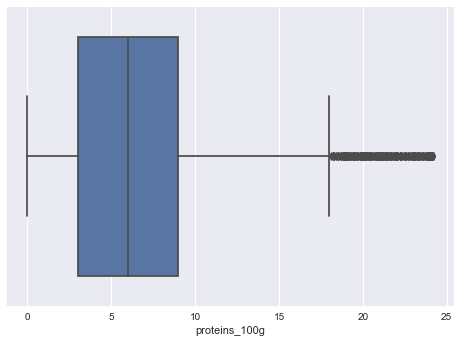

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



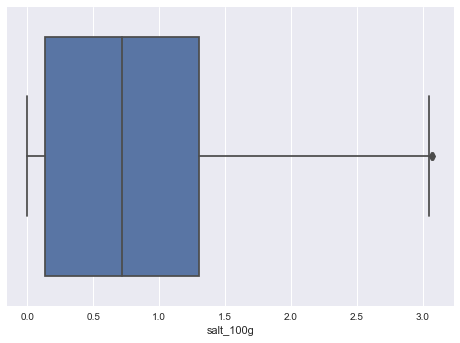

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



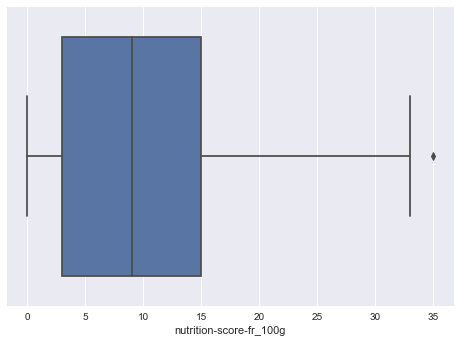

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



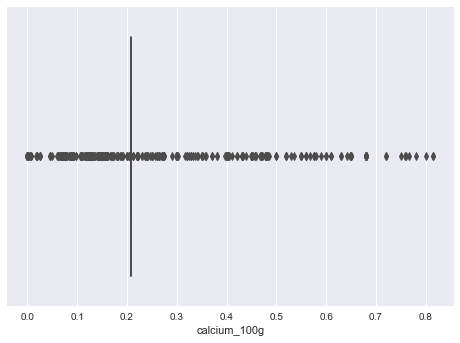

In [197]:
for col in data_clean.select_dtypes('float'):
    plt.figure()
    sns.boxplot(data_clean[col])
    plt.show()

On a trouvé qu'il y avait une difference entre le type de nutrigrade (A B C D E ) et les differentes varibles ( voir le boxplot)

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



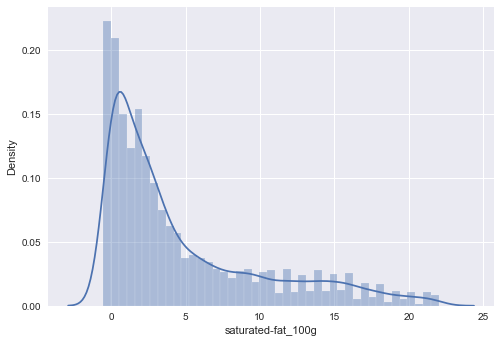

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



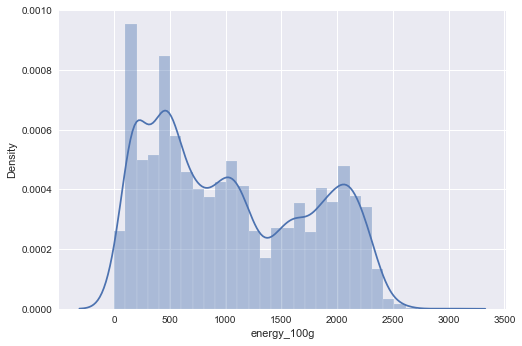

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



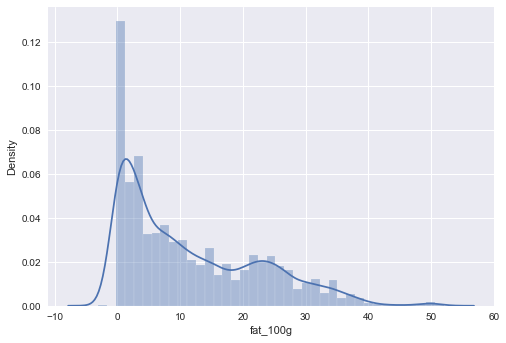

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



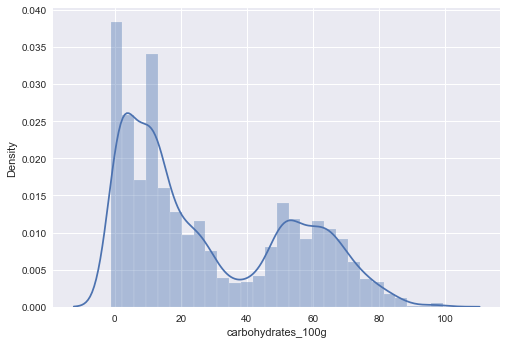

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



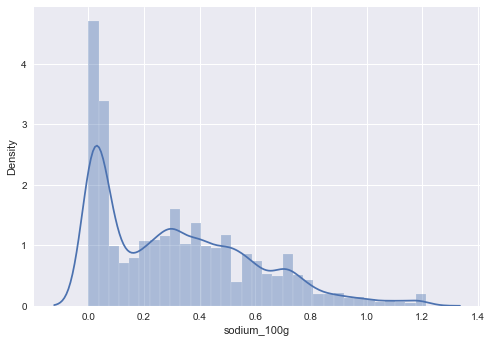

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



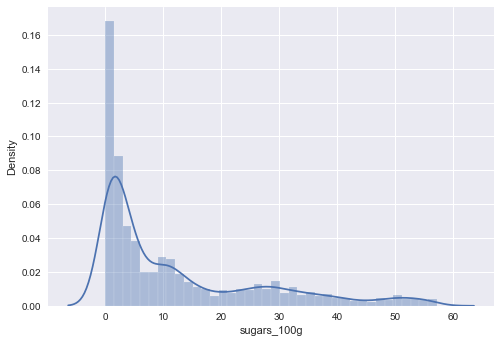

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



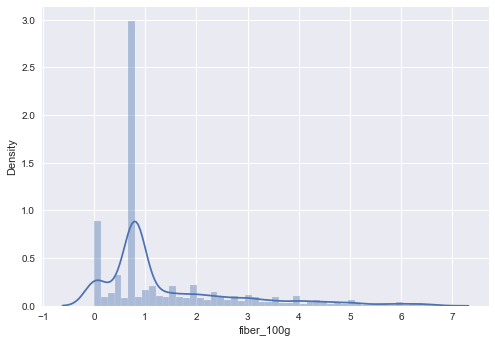

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



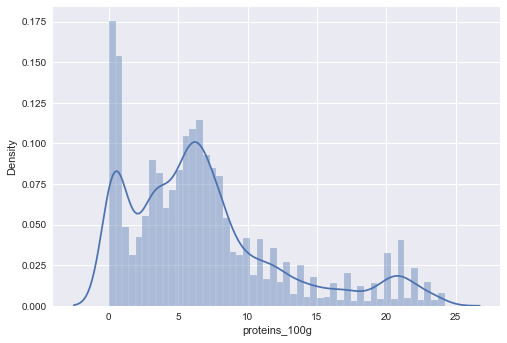

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



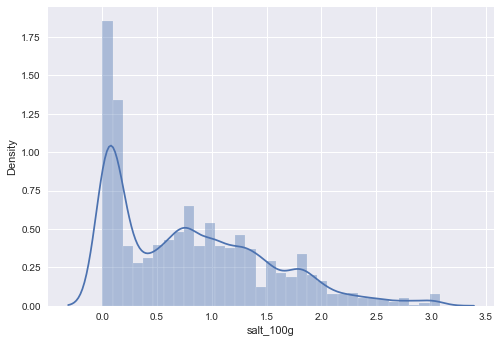

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



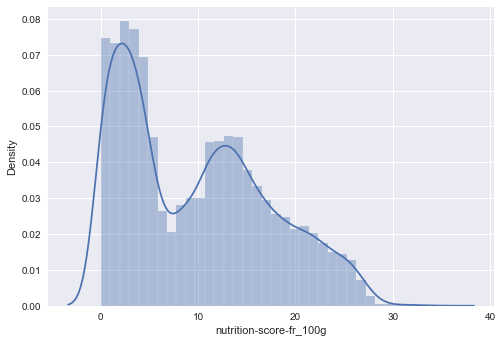

C:\Users\yosra\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



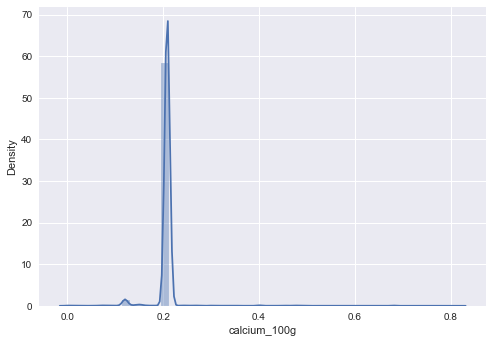

In [198]:
for col in data_clean.select_dtypes('float'):
    plt.figure()
    sns.distplot(data_clean[col])
    plt.show()

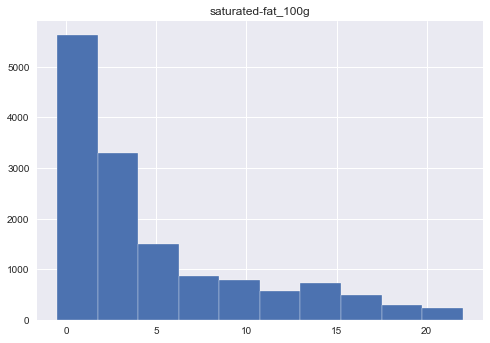

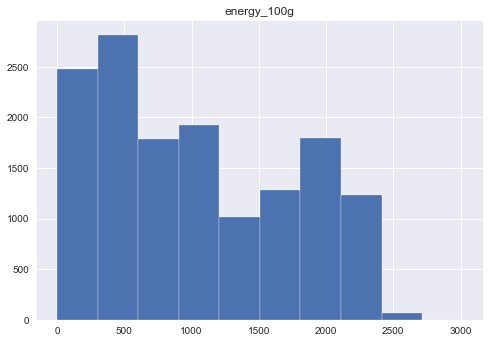

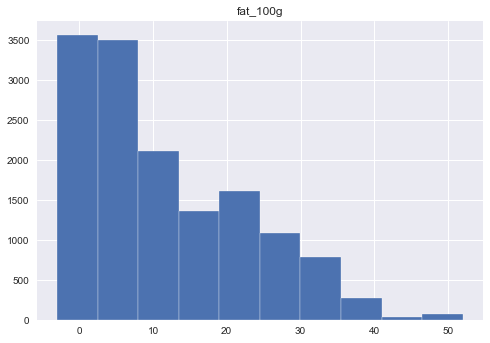

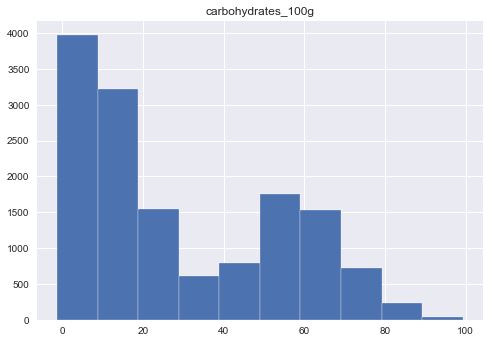

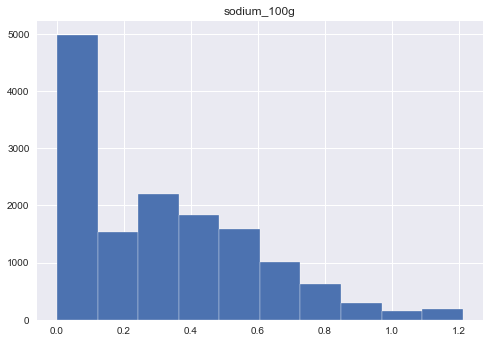

...

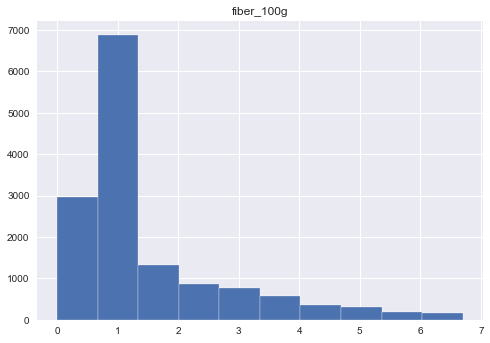

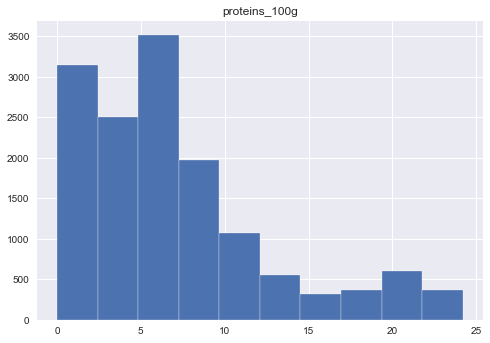

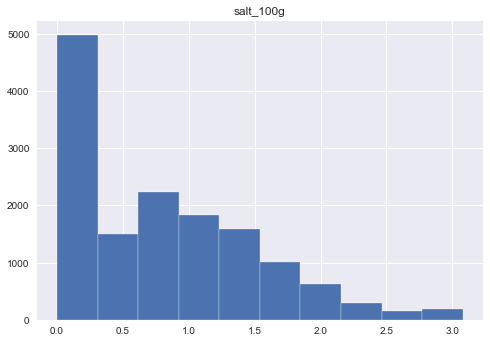

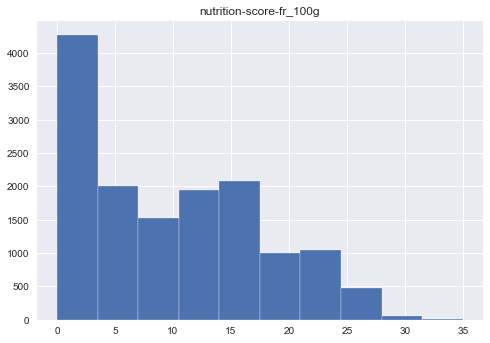

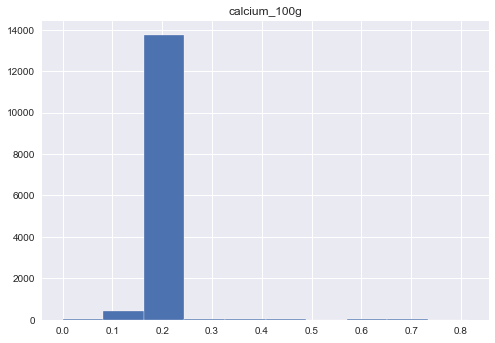

In [199]:
for col in data_clean.select_dtypes('float'):
    data_clean.hist(col)
    

<function matplotlib.pyplot.show(close=None, block=None)>

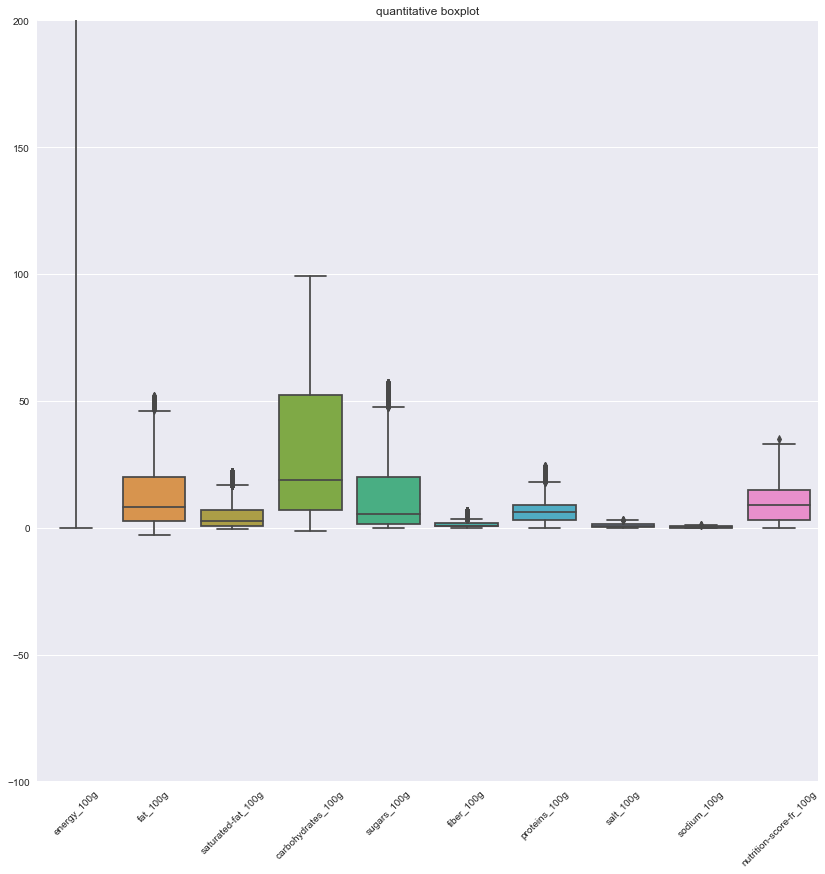

<Figure size 576x396 with 0 Axes>

In [200]:

quant_variables = [ 'energy_100g', 'fat_100g', 'saturated-fat_100g',
         'carbohydrates_100g','sugars_100g', 'fiber_100g', 'proteins_100g',
         'salt_100g','sodium_100g',  'nutrition-score-fr_100g']


degrees = 45

fig = plt.figure(figsize=(14 ,14))
ax = plt.axes()
plt.xticks(rotation=degrees)
ax.set_ylim([-1e2,2e2])
sns.boxplot(data=data_clean[quant_variables]).set_title('quantitative boxplot');
plt.figure(edgecolor='black', linewidth=4)
plt.show

# Analyse bivariée 

## Analyse bivariée de deux variables numériques (Numérique-Numérique)

### Nuage de points

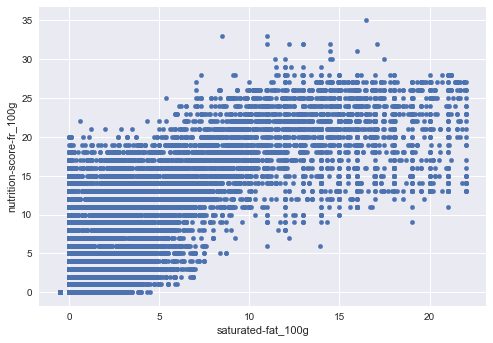

In [201]:
data_clean.plot.scatter(x='saturated-fat_100g', y='nutrition-score-fr_100g')
plt.show()

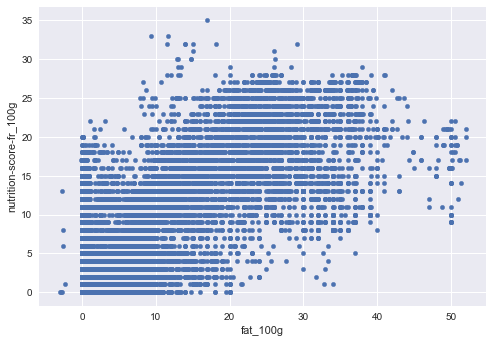

In [202]:
data_clean.plot.scatter(x='fat_100g', y='nutrition-score-fr_100g')
plt.show()

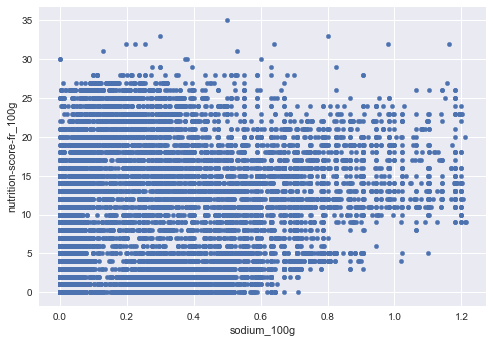

In [203]:
data_clean.plot.scatter(x='sodium_100g', y='nutrition-score-fr_100g')
plt.show()

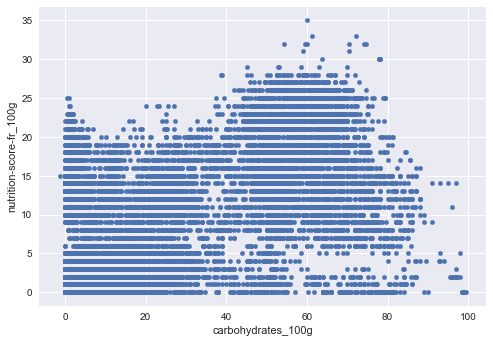

In [204]:
data_clean.plot.scatter(x='carbohydrates_100g', y='nutrition-score-fr_100g')
plt.show()

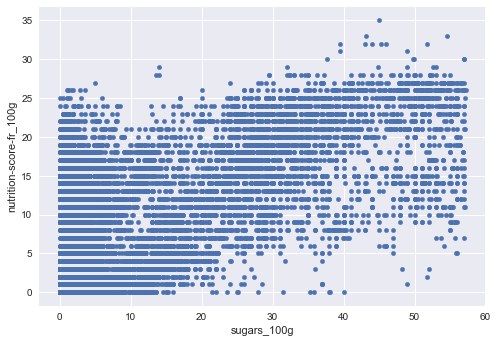

In [205]:
data_clean.plot.scatter(x='sugars_100g', y='nutrition-score-fr_100g')
plt.show()

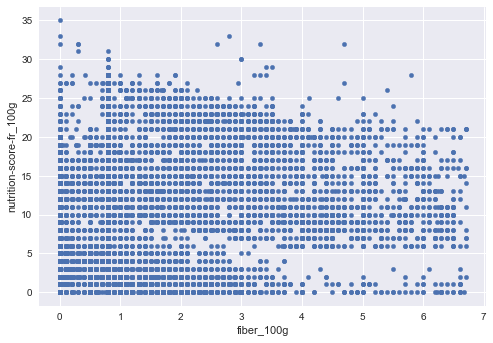

In [206]:
data_clean.plot.scatter(x='fiber_100g', y='nutrition-score-fr_100g')
plt.show()

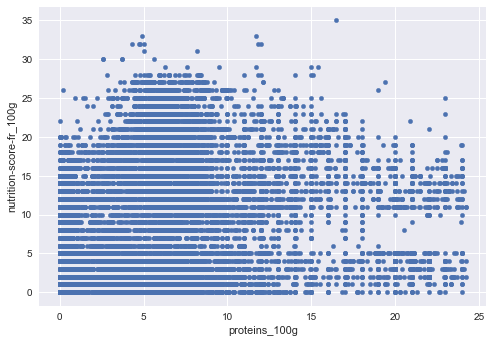

In [207]:
data_clean.plot.scatter(x='proteins_100g', y='nutrition-score-fr_100g')
plt.show()

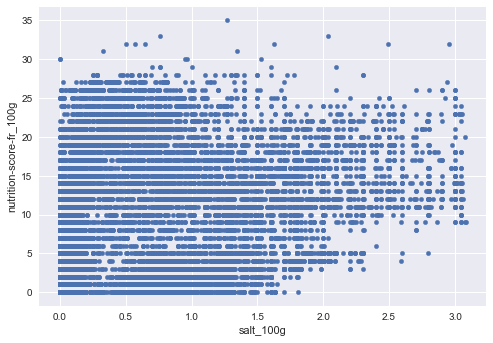

In [208]:
data_clean.plot.scatter(x='salt_100g', y='nutrition-score-fr_100g')
plt.show()

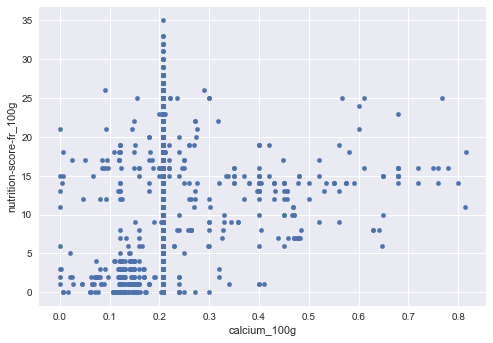

In [209]:
data_clean.plot.scatter(x='calcium_100g', y='nutrition-score-fr_100g')
plt.show()

## Analyse Bivariée d'une variable Numérique et d'une variable catégorielle (Numérique-Catégorique)

BOX.PLOT

<AxesSubplot:xlabel='saturated-fat_100g', ylabel='nutrition_grade_fr'>

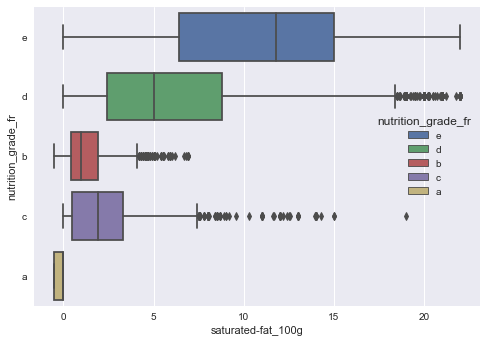

In [210]:
sns.boxplot(data=data_clean, x="saturated-fat_100g", y="nutrition_grade_fr", hue="nutrition_grade_fr", dodge=False)

<AxesSubplot:xlabel='fat_100g', ylabel='nutrition_grade_fr'>

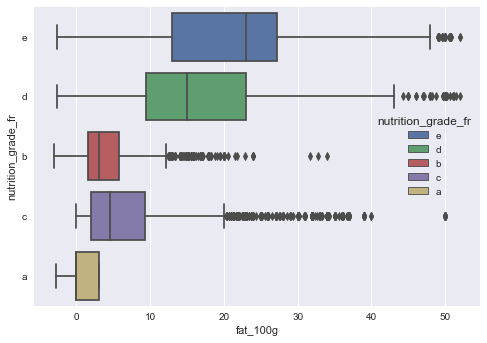

In [211]:
sns.boxplot(data=data_clean, x="fat_100g", y="nutrition_grade_fr", hue="nutrition_grade_fr", dodge=False)

<AxesSubplot:xlabel='sodium_100g', ylabel='nutrition_grade_fr'>

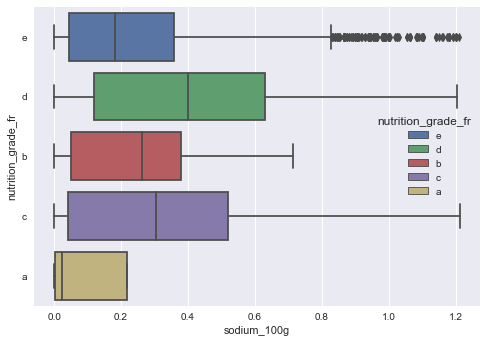

In [212]:
sns.boxplot(data=data_clean, x="sodium_100g", y="nutrition_grade_fr", hue="nutrition_grade_fr", dodge=False)

<AxesSubplot:xlabel='carbohydrates_100g', ylabel='nutrition_grade_fr'>

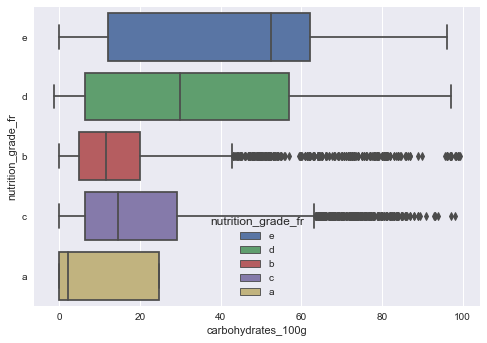

In [213]:
sns.boxplot(data=data_clean, x="carbohydrates_100g", y="nutrition_grade_fr", hue="nutrition_grade_fr", dodge=False)

ici on remarque que le nutrigrade d et e est elvée en carbohydrat


<AxesSubplot:xlabel='sugars_100g', ylabel='nutrition_grade_fr'>

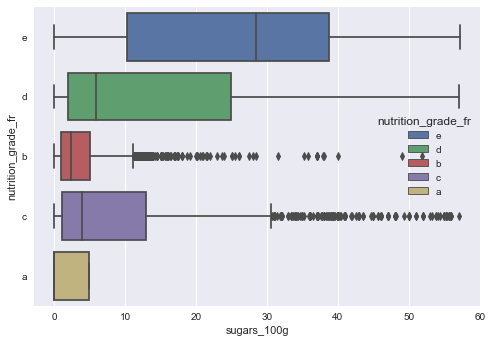

In [214]:

sns.boxplot(data=data_clean, x="sugars_100g", y="nutrition_grade_fr", hue="nutrition_grade_fr", dodge=False)

<AxesSubplot:xlabel='fiber_100g', ylabel='nutrition_grade_fr'>

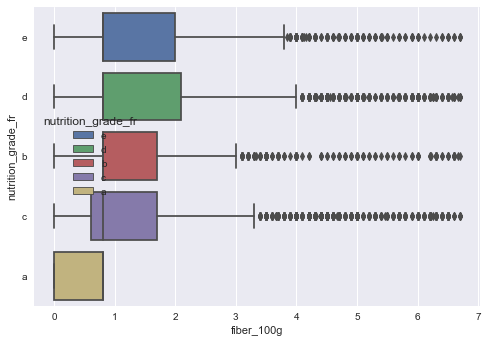

In [215]:
sns.boxplot(data=data_clean, x="fiber_100g", y="nutrition_grade_fr", hue="nutrition_grade_fr", dodge=False)

<AxesSubplot:xlabel='salt_100g', ylabel='nutrition_grade_fr'>

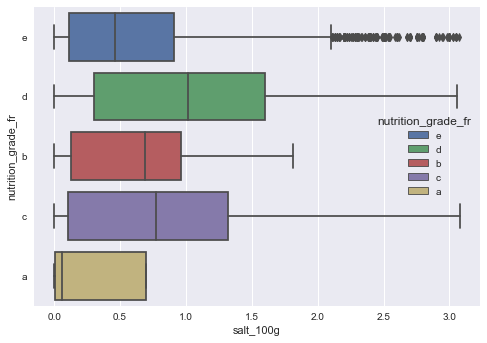

In [216]:
sns.boxplot(data=data_clean, x="salt_100g", y="nutrition_grade_fr", hue="nutrition_grade_fr", dodge=False)

<AxesSubplot:xlabel='proteins_100g', ylabel='nutrition_grade_fr'>

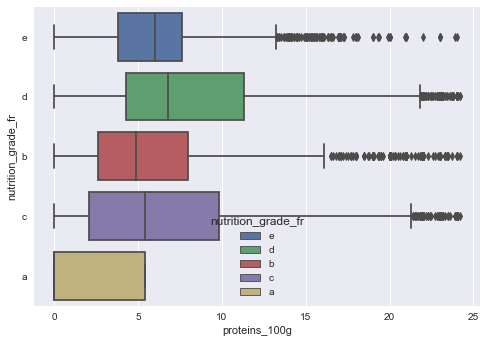

In [217]:
sns.boxplot(data=data_clean, x="proteins_100g", y="nutrition_grade_fr", hue="nutrition_grade_fr", dodge=False)

On a trouvé qu'il y avait une difference entre le type de nutrigrade (A B C D E ) et les differentes varibles ( voir le boxplot)

In [218]:
# Analyse de variance (Anova)

In [219]:
numeric_columns = data_clean.filter(regex='_100g').columns
numeric_columns

Index(['saturated-fat_100g', 'energy_100g', 'fat_100g', 'carbohydrates_100g',
       'sodium_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
       'salt_100g', 'nutrition-score-fr_100g', 'calcium_100g'],
      dtype='object')

## Test de normalité avec shapiro

In [220]:
# normality test

for column in numeric_columns:
    print('________\n{}'.format(column))
    stat, p = shapiro(data_clean[column])
    print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
    alpha = 0.05
    if p > alpha:
        print("H0 ne peut être rejetée :{}, on considère l'hypothèse de normalité, l'échantillon semble gaussien".format(column))
    else:
        print("H0 est rejetée : {} n'est pas une distribution normale, l'échantillon n'a pas l'air gaussien ".format(column))

________
saturated-fat_100g
Statistics=0.816, p=0.000
H0 est rejetée : saturated-fat_100g n'est pas une distribution normale, l'échantillon n'a pas l'air gaussien 
________
energy_100g
Statistics=0.928, p=0.000
H0 est rejetée : energy_100g n'est pas une distribution normale, l'échantillon n'a pas l'air gaussien 
________
fat_100g
Statistics=0.892, p=0.000
H0 est rejetée : fat_100g n'est pas une distribution normale, l'échantillon n'a pas l'air gaussien 
________
carbohydrates_100g
Statistics=0.885, p=0.000
H0 est rejetée : carbohydrates_100g n'est pas une distribution normale, l'échantillon n'a pas l'air gaussien 
________
sodium_100g
Statistics=0.917, p=0.000
H0 est rejetée : sodium_100g n'est pas une distribution normale, l'échantillon n'a pas l'air gaussien 
________
sugars_100g
Statistics=0.801, p=0.000
H0 est rejetée : sugars_100g n'est pas une distribution normale, l'échantillon n'a pas l'air gaussien 
________
fiber_100g
Statistics=0.784, p=0.000
H0 est rejetée : fiber_100g n'es

C:\Users\yosra\anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning:

p-value may not be accurate for N > 5000.



Suite au test de normalité avec shapiro  qui montre que toute mes nutrition ont une distribution anormale , de ce fait je ne pourrai pas faire l'ANOVA mais j'appliquerai le test de Kruskal Wallis ( qui n'est pas liée à la normalité d'un échantillon)

## Analyse explicative: Kruskal Wallis


In [221]:
data_a = data_clean[data_clean['nutrition_grade_fr'] == 'a'].select_dtypes(['float64'])
data_b = data_clean[data_clean['nutrition_grade_fr'] == 'b'].select_dtypes(['float64'])
data_c = data_clean[data_clean['nutrition_grade_fr'] == 'c'].select_dtypes(['float64'])
data_d = data_clean[data_clean['nutrition_grade_fr'] == 'd'].select_dtypes(['float64'])
data_e = data_clean[data_clean['nutrition_grade_fr'] == 'e'].select_dtypes(['float64'])

In [222]:


def kurskal_most_col(data):
    X = "nutrition_grade_fr" # qualitative
    Y = data.filter(regex='_100g').columns# quantitative
    p = []
    feature = []
    for col in Y:     
        p.append(stats.kruskal(data_a[col], data_b[col], data_c[col], data_d[col], data_e[col]))
        feature.append(col)
        df = pd.DataFrame (np.column_stack([feature, p]), columns = ['feature', 'statistic', 'pvalue'])
    return df

In [223]:
kurskal_most_col(data_clean)

,feature,statistic,pvalue
0,saturated-fat_100g,4120.441018306976,0.0
1,energy_100g,4061.8157183717226,0.0
2,fat_100g,3785.7016517582733,0.0
3,carbohydrates_100g,1567.0977759761533,0.0
4,sodium_100g,767.5272326427312,8.294172707507511e-165
5,sugars_100g,3180.997565471611,0.0
6,fiber_100g,81.49614350891868,8.394091715329268e-17
7,proteins_100g,369.17627695722797,1.2674774737959873e-78
8,salt_100g,762.7417238978051,9.020360342560205e-164
9,nutrition-score-fr_100g,12783.484506754283,0.0


Valeur de p ≤ 0.05 : les différences entre certaines médianes sont statistiquement significatives.

Dans mon cas tout les valeurs de P sont inferieur à 0.05 du coup je rejete l'hypothèse nulle et je conclu que toutes les medianes de mes nutritions sont differents. Au moins une médiane est différente

In [224]:
data_clean1 = data_clean.copy()

In [225]:
corr_dataframe = data_clean1.corr()


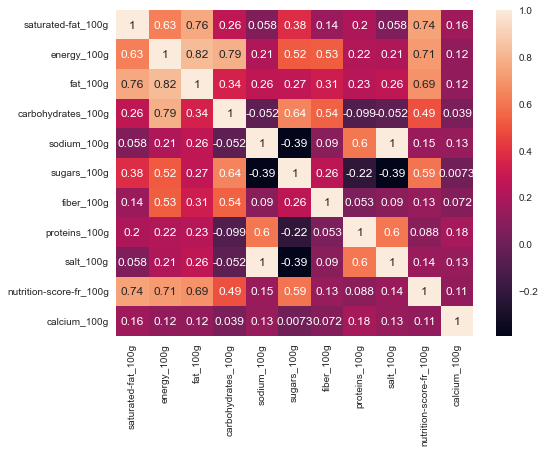

In [226]:
plt.figure(figsize=(8, 6))
sns.heatmap(corr_dataframe, annot=True)
plt.show()

energy_100g a une forte corrélation avec :
                                          
      • carbohydrates_100g
      • nutrition-score-fr_100g

 fat_100g a une forte corrélation avec 
 
       • saturated-fat_100g 
       • energy_100g

 nutrition-score-fr_100g a une forte corrélation avec 
 
     • energy_100g
     • saturated_fat_100g

carbohydrates_100g est fotement correlées avec energy_100g

saturated_fat_100ga une forte corrélation avec 

    • fat_100g
     • nutrition-score-fr_100
     
   
     

In [227]:
variables_corr = [
    'energy_100g', 'sugars_100g', 'saturated-fat_100g', 'fiber_100g', 'fat_100g', 'nutriscore_score', 'saturated_fat_100g'
]

# Analyse Multivariable

## Analyse des composants principaux

## ACP : Analyse en compsante principal

-Visialiser les données multidimentionnelles

-Decorreler les variables

-Debruiter les données

-Effectuer une reduction de dimension des données


In [228]:
df_acp = data_clean
df_acp

,code,last_modified_datetime,pnns_groups_1,saturated-fat_100g,product_name,brands,countries_fr,ingredients_text,serving_size,nutrition_grade_fr,energy_100g,fat_100g,carbohydrates_100g,sodium_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,calcium_100g
0,0000040608754,2015-08-09T17:35:31Z,Beverages,0.0,"Pepsi, Nouveau goût !",Pepsi,France,"Eau gazéifiée, sucre, colorant caramel E150d, ...",150ml,e,177.0,0.0,10.4,0.010000,10.4,0.0,0.0,0.025400,13.0,0.208189
1,0000087177756,2015-06-06T11:13:26Z,Beverages,0.0,7Up,"7Up,Pepsico",France,"Eau gazéifiée, sucre, acidifiants (acide citri...",33 cl,e,177.0,0.0,10.4,0.039370,10.4,0.8,0.0,0.100000,13.0,0.208189
2,000010,2016-10-20T09:14:39Z,Sugary snacks,2.5,Madeleines nature,Bijou,France,"Farine de _blé_, huile de colza, sucre, _oeufs...",17.6g,d,1900.0,23.0,55.0,0.259843,26.0,1.5,6.0,0.660000,12.0,0.208189
3,000030,2016-12-15T22:24:04Z,Sugary snacks,2.5,Cakes Raisins,Bijou,France,"Farine de _blé_, _œufs_ frais, huile de colza,...",30 g,d,1768.0,19.0,56.0,0.255906,28.0,1.8,5.8,0.650000,13.0,0.208189
4,000031,2016-08-18T20:16:30Z,Sugary snacks,2.0,Cakes aux Fruits,Bijou,France,"Fruits 37.4% [fruits confits 21,5% [fruits (pa...",30 g,d,1670.0,15.0,60.0,0.236220,34.0,1.5,4.9,0.600000,12.0,0.208189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14409,9310072000480,2017-02-01T21:24:09Z,Sugary snacks,7.3,Sao,Arnott's,France,"Farine de _blé_, huile végétale, sel, levure d...","25,8 g (3 biscuits)",d,1900.0,15.1,67.0,0.700000,1.1,3.7,10.0,1.778000,14.0,0.208189
14410,9312937129602,2017-03-23T15:25:20Z,Beverages,0.0,Goji berry,The Berry Company,France,"Water, fruit juices from concentrate and press...",250 ml,c,206.0,0.2,11.5,0.000000,10.3,0.8,0.0,0.000000,4.0,0.208189
14411,9556041608251,2016-02-25T13:54:27Z,Beverages,18.0,Lait de Coco,Ayam,France,extrait de noix de coco d'Indonésie ou de Mala...,100 ml,d,862.0,20.0,3.4,0.019700,2.7,0.5,2.1,0.050038,12.0,0.208189
14412,9556417639339,2017-03-31T22:18:54Z,Cereals and potatoes,1.0,Mantou Sandwich,PA Food,France,"Farine de _blé_ (55.35%), eau (26.6%), sucre, ...",25 g (bun),b,1218.0,2.0,60.0,0.023622,14.0,0.3,8.0,0.060000,2.0,0.208189


In [229]:
data_pca  = data_clean.filter(regex='_100g').drop(['nutrition-score-fr_100g'], axis=1)

In [230]:
data_pca

,saturated-fat_100g,energy_100g,fat_100g,carbohydrates_100g,sodium_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,calcium_100g
0,0.0,177.0,0.0,10.4,0.010000,10.4,0.0,0.0,0.025400,0.208189
1,0.0,177.0,0.0,10.4,0.039370,10.4,0.8,0.0,0.100000,0.208189
2,2.5,1900.0,23.0,55.0,0.259843,26.0,1.5,6.0,0.660000,0.208189
3,2.5,1768.0,19.0,56.0,0.255906,28.0,1.8,5.8,0.650000,0.208189
4,2.0,1670.0,15.0,60.0,0.236220,34.0,1.5,4.9,0.600000,0.208189
...,...,...,...,...,...,...,...,...,...,...
14409,7.3,1900.0,15.1,67.0,0.700000,1.1,3.7,10.0,1.778000,0.208189
14410,0.0,206.0,0.2,11.5,0.000000,10.3,0.8,0.0,0.000000,0.208189
14411,18.0,862.0,20.0,3.4,0.019700,2.7,0.5,2.1,0.050038,0.208189
14412,1.0,1218.0,2.0,60.0,0.023622,14.0,0.3,8.0,0.060000,0.208189


In [231]:
X = data_pca.values
names = data_pca.index
features = data_pca.columns

std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [232]:
n_comp = 10

In [233]:
acp = decomposition.PCA(n_components=n_comp)
acp.fit(X_scaled)

PCA(n_components=10)

In [234]:
def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

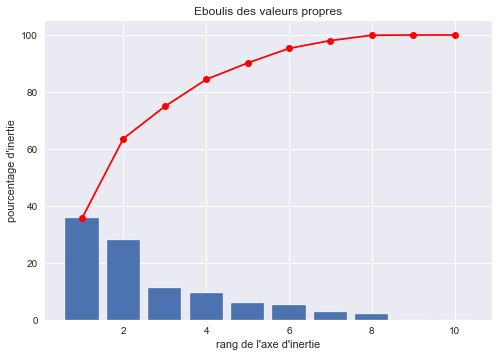

In [235]:
# Eboulis des valeurs propres
display_scree_plot(acp)

Le diagramme eboulis des valeurs propres

C'est qui décrit le pourcentage d’inertie totale associé à chaque axe.

Represente la somme cumulée des inerties, c’est une courbe qui part de l’origine avec 38% de 

pourcentage d'inertie pour l'axe1, ensuite 60% pour l'axe2 et qui arrive à 100 % après avoir parcouru tous les axes.
En tout on a 10 axe

In [236]:
## Cercles des corrélations

In [237]:
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(8,7))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

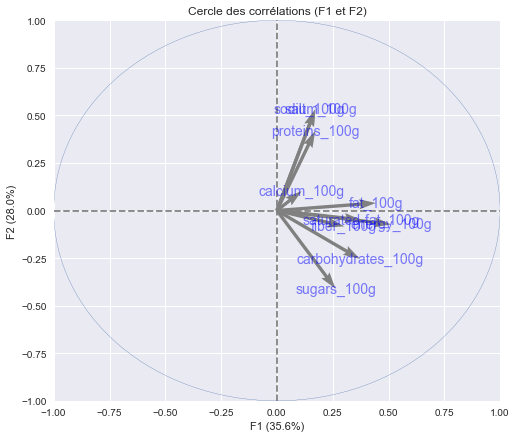

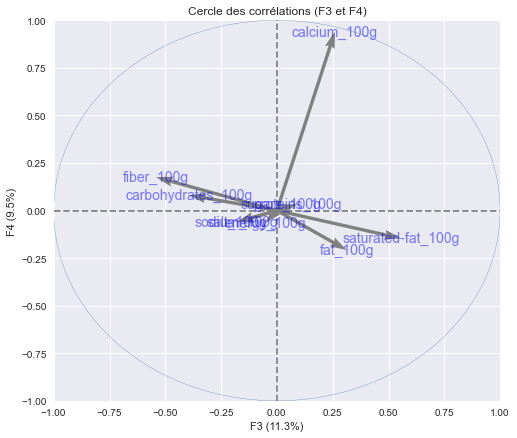

In [238]:
pcs = acp.components_
display_circles(pcs, n_comp, acp, [(0,1),(2,3)], labels = np.array(features))

Le cercle des corrélations nous montre les variables qui sont très corrélées (ou anticorrélées.) 
F1 peut être considéré  comme une nouvelle variable que l’on peut  ajouté sous forme d'une colonne à notre échantillon.

## Les composantes F1 et F2:

Les 2 premières composantes principales F1 et F2:

F1 est très corrélée aux variables FAT, fibre, Saturead_fat,
alors il y a une grande chance  pour que ces individus aient aussi des valeurs importantes pour ces variables.

## Les composantes F3 et F4:

Les variables les plus corrélées à F3 sont :

Fat ;

Fat_saturead .

Elles sont corrélées positivement à F3, mais on a aussi les variable fibre et carbohydrate qui sont corrélées négativement à F3.


## Projection des individus

In [239]:
# le nutrigrade de chaque produit(A,B,C,D,E)
grade = data_clean.loc[:,'nutrition_grade_fr']
grade

0        e
1        e
2        d
3        d
4        d
        ..
14409    d
14410    c
14411    d
14412    b
14413    c
Name: nutrition_grade_fr, Length: 14414, dtype: object

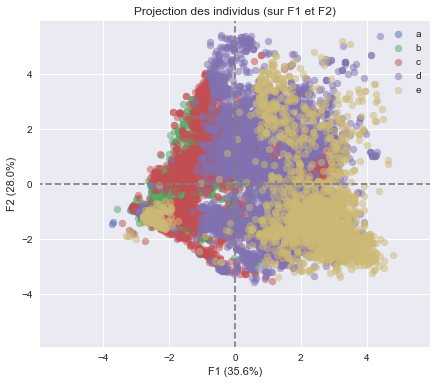

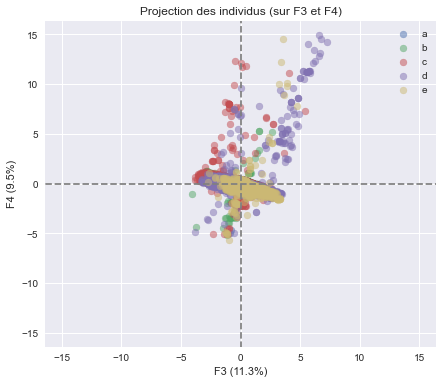

In [240]:
# Projection des individus
X_projected = acp.transform(X_scaled)
display_factorial_planes(X_projected, n_comp, acp, [(0,1),(2,3)], illustrative_var = grade, alpha = 0.5)

plt.show()

### Composant F1/F2

les nutrigrade E est representé par la couleur jaune : on remarque qu'ils ont une tendance à se regrouper vers les abscisses positives (importantes) alors que les nutrigrade C representé par la couleur rouge ont tendance à se regrouper vers les abscisses negatives (faibles). 

La nutrigrade D representé par la couleur violet ont tendance à se regroupement dans les deux parties des abscises, une partie vers les abscises faibles et l'autre partie vers l'abscises importantes

F1 représente le gras, le sucre , le sel , le carbohydrate  qui sont représentés  par des produits de mauvaise qualité (e) 

## Conclusion

Dataset Open Food Facts : données de très bonne qualité avec u peu de valeur aberrantes

Mes Observations

*Non indépendance des donnée 

*Corrélation forte de certaines variables avec le nutriscore

Perceptive (Application):
    
Rescoring des produits en se basant sur les features traitées.